# <center style='background-color:navy'>LuxeDrive Insurance: Customer Lifetime Value Regression </center>
---
<center>Muhammad Difagama Ivanka</center>

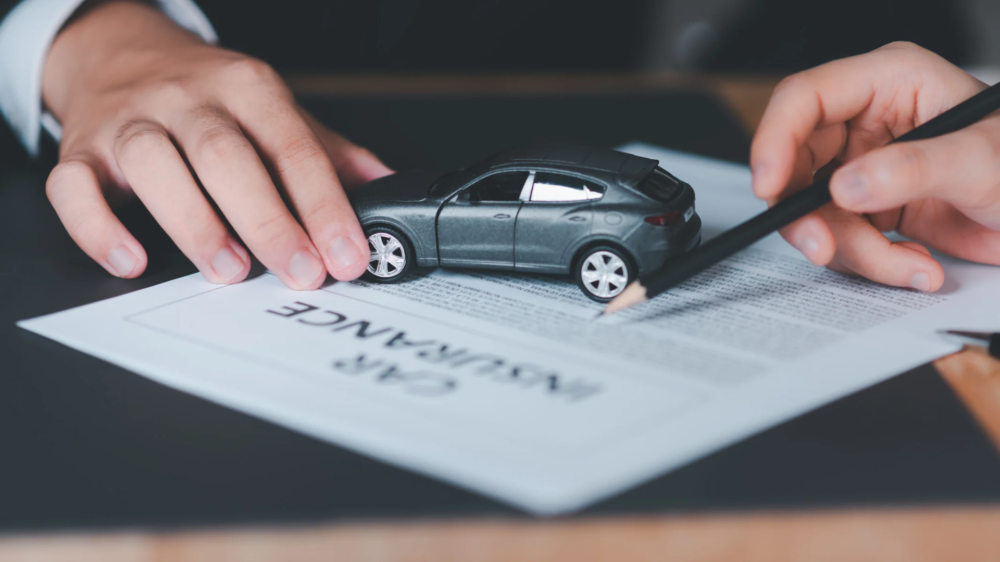

# 1. Business Background

## Context

Customer Lifetime Value Optimization for Luxury Vehicle Insurance

At LuxeDrive Insurance, we specialize in providing premium car insurance tailored to the unique needs of luxury car, luxury SUV, and sports car owners. In the high-end vehicle insurance market, accurately predicting Customer Lifetime Value (CLV) is essential for driving profitable growth and delivering exceptional customer experiences. However, the distinct characteristics and usage patterns of luxury vehicles pose a significant challenge in predicting CLV with precision. This hampers our ability to effectively allocate marketing resources, design personalized insurance products, and implement targeted retention strategies.

According to industry research, luxury vehicle owners exhibit different driving behaviors and maintenance patterns compared to ordinary car owners. For instance, they tend to invest more in vehicle upkeep and safety features, which can influence insurance claims and overall risk profiles. Additionally, luxury vehicles often have higher repair costs, which affects claim frequency and severity.

Furthermore, we focuses on enhancing the accuracy of CLV predictions specifically for luxury car, luxury SUV, and sports car segments, where the CLV threshold is set at $20,000 and below. These vehicle types represent high-value customers with substantial revenue potential, but also come with unique risk profiles. By refining our CLV prediction models to better capture the nuances of these luxury vehicle types, LuxeDrive Insurance can strategically prioritize high-value customers, optimize pricing, and tailor marketing efforts. This targeted approach will not only increase customer satisfaction and loyalty but also drive profitability by ensuring that resources are aligned with our most lucrative customer segments. At the end, the use of **Machine Learning will help** to automate these processes.

## Problems

## Goals

- **Enhance CLV Prediction Accuracy:**
  - Develop and refine predictive models to accurately estimate the Customer Lifetime Value (CLV) especially for customer that own luxury car, luxury SUV, and sports car segments.
  
- **Segment-Specific Strategies:**
  - Tailor marketing, retention, and pricing strategies specifically for luxury car, luxury SUV, and sports car owners based on the refined CLV predictions.
  
- **Improve Customer Acquisition and Retention:**
  - Identify and prioritize high-value customers within the luxury vehicle segments to optimize acquisition and retention efforts.
  
- **Personalize Insurance Products:**
  - Design and offer personalized insurance products that cater to the unique needs and risk profiles of luxury car, luxury SUV, and sports car owners.
  
- **Optimize Resource Allocation:**
  - Efficiently allocate marketing and operational resources towards the most profitable customer segments to maximize ROI.
  
- **Increase Customer Satisfaction and Loyalty:**
  - Enhance customer satisfaction by providing tailored services and products, leading to improved customer loyalty and long-term relationships.
  
- **Boost Profitability:**
  - Drive profitability by aligning business strategies with high-value customer segments, ensuring a balanced approach to risk and revenue.

## Limitations

- Only customer that have Customer Lifetime Value less than $20,000 will be included.

- There is no feature to show the number of transaction of each Customer.

- There is no feature of Cost Acquisition for each Customer.

# 2. Data Understanding

| Feature Name | Description | Type | Role |
| --- | --- | --- | --- |
Customer Lifetime Value (CLV) | Total revenue expected from a customer insurance (USD) | Numeric | Target variable
Number of Policies | Number of insurance policies held by the customer | Numeric | Feature
Monthly Premium Auto | Monthly premium amount paid for auto insurance | Numeric	| Feature
Total Claim Amount | Total amount claimed over the insurance period (USD) | Numeric	| Feature
Income | Annual income of the customer (USD) | Numeric | Feature
Vehicle Class | Type of the customer's vehicle <br>(Two-Door Car, Four-Door Car SUV, Luxury SUV, <br>Sports Car, or Luxury Car) | Categorical | Feature
Coverage | Type of coverage (e.g., Basic, Extended, Premium) | Categorical | Feature
Renew Offer Type | Type of renewal offer made to the customer <br>(Offer 1, Offer 2, Offer 3 and Offer 4) | Categorical	| Feature
EmploymentStatus | Employment status of the customer <br>(Employed, Unemployed, Medical Leave, Disabled, or Retired) | Categorical	| Feature
Marital Status | Marital status of the customer (Married, Divorced, or Single) | Categorical | Feature
Education | Highest level of education attained by the customer <br>(High School or Below, Bachelor, College, Master, or Doctor) | Categorical | Feature

[Source Data](https://rpubs.com/adindaherawati/classificationproject)

## Import Packages

In [137]:
# libraries
RANDOM_STATE = 233

# basic analysis & viz
import numpy as np
np.random.seed(RANDOM_STATE)

import pandas as pd
import seaborn as sns
import missingno as msn
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# plt.style.use('ggplot')
sns.set_style('darkgrid', {'grid.background': 'blue'})

# statistics
import statsmodels.api as sm
from statsmodels.tools.eval_measures import rmse
from statsmodels.stats.outliers_influence import variance_inflation_factor

# from sklearn.datasets import load_boston
# from fairlearn.datasets import fetch_boston

# split & metrics
from sklearn.model_selection import (
    cross_validate, cross_val_score,
    GridSearchCV, KFold, RandomizedSearchCV, 
    train_test_split, StratifiedKFold 
)
from skopt import BayesSearchCV
from skopt.space import Real, Integer
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score,
    mean_absolute_percentage_error, make_scorer,
    root_mean_squared_error, PredictionErrorDisplay
)
from sklearn.metrics._scorer import _SCORERS

# preprocessing
# import smogn
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline

from sklearn.preprocessing import (
    OneHotEncoder, KBinsDiscretizer, MinMaxScaler,
    OrdinalEncoder, RobustScaler, StandardScaler,
    PolynomialFeatures, 
)
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import RFE, RFECV

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer, KNNImputer
from category_encoders import BinaryEncoder

# models
import shap
shap.initjs()

from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.linear_model import (
    LinearRegression, Lasso, Ridge,
    HuberRegressor, TheilSenRegressor,
    QuantileRegressor, RANSACRegressor
)

from sklearn.ensemble import (
    AdaBoostRegressor, GradientBoostingRegressor,
    VotingRegressor, RandomForestRegressor
)
from sklearn.neural_network import MLPRegressor
from xgboost.sklearn import XGBRegressor
from lightgbm import LGBMRegressor

# others
import os
import sys
import time
import pickle
from collections import Counter

from helpers.functions_python import(
    check_nullity_uniqueness,
    show_uniqueness_value,
    plot_distribution_outliers,
    calculate_outliers,
    scatter_numerical_vs_target,
    stripplot_categorical_vs_target
)

import warnings
warnings.filterwarnings('ignore')

## Data Preview

In [138]:
# read the data as dataframe

car_clv_insurance = pd.read_csv('data_customer_lifetime_value.csv')
car_clv_insurance

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
0,Four-Door Car,Extended,Offer1,Retired,Divorced,High School or Below,2.0,90.0,571.479602,11828.0,10083.486880
1,Four-Door Car,Basic,Offer1,Employed,Married,College,6.0,62.0,114.514440,44762.0,4943.386117
2,Two-Door Car,Basic,Offer1,Retired,Married,Master,2.0,62.0,257.248789,21514.0,11981.984810
3,Four-Door Car,Premium,Offer3,Disabled,Married,High School or Below,1.0,116.0,556.800000,17913.0,4550.856045
4,Two-Door Car,Basic,Offer3,Medical Leave,Married,High School or Below,1.0,62.0,355.820799,19030.0,2372.155492
...,...,...,...,...,...,...,...,...,...,...,...
5664,Four-Door Car,Basic,Offer4,Unemployed,Single,High School or Below,1.0,74.0,532.800000,0.0,2442.216651
5665,Four-Door Car,Premium,Offer1,Employed,Divorced,Bachelor,2.0,109.0,523.200000,27778.0,12904.943360
5666,Four-Door Car,Basic,Offer1,Employed,Single,Bachelor,1.0,62.0,44.780402,84658.0,2447.053134
5667,Luxury SUV,Extended,Offer2,Employed,Divorced,Master,7.0,239.0,1294.700423,22705.0,19160.989940


In [127]:
# Check data nullity, unique value
    
check_nullity_uniqueness(car_clv_insurance)

,feature,data_type,null,negative,n_unique,sample_unique
0,Vehicle Class,object,0.0,False,6,"[Four-Door Car, Two-Door Car, SUV, Sports Car,..."
1,Coverage,object,0.0,False,3,"[Extended, Basic, Premium]"
2,Renew Offer Type,object,0.0,False,4,"[Offer1, Offer3, Offer2, Offer4]"
3,EmploymentStatus,object,0.0,False,5,"[Retired, Employed, Disabled, Medical Leave, U..."
4,Marital Status,object,0.0,False,3,"[Divorced, Married, Single]"
5,Education,object,0.0,False,5,"[High School or Below, College, Master, Bachel..."
6,Number of Policies,float64,0.0,False,9,"[2.0, 6.0, 1.0, 8.0, 5.0, 3.0, 7.0, 4.0, 9.0]"
7,Monthly Premium Auto,float64,0.0,False,191,"[90.0, 62.0, 116.0, 107.0, 101.0, 66.0, 65.0, ..."
8,Total Claim Amount,float64,0.0,False,3274,"[571.479602, 114.51444, 257.248789, 556.8, 355..."
9,Income,float64,0.0,False,3625,"[11828.0, 44762.0, 21514.0, 17913.0, 19030.0, ..."


## Descriptive Statistics

In [6]:
# statistics of numerical features

car_clv_insurance.describe().T

,count,mean,std,min,25%,50%,75%,max
Number of Policies,5669.0,2.979361,2.393187,1.000000,1.000000,2.000000,4.000000,9.000000
Monthly Premium Auto,5669.0,93.026989,34.551795,61.000000,68.000000,82.000000,109.000000,297.000000
Total Claim Amount,5669.0,431.407103,287.558038,0.423310,266.932542,379.200000,549.986128,2759.794354
Income,5669.0,37868.188569,30490.490723,0.000000,0.000000,34322.000000,62464.000000,99934.000000
Customer Lifetime Value,5669.0,8029.874592,6916.708246,1898.007675,3954.344534,5800.188903,9031.214859,83325.381190


> There is no anomaly value for numerical features, like negative value.

In [5]:
# statistics of categorical features

car_clv_insurance.describe(include='O').T

,count,unique,top,freq
Vehicle Class,5669,6,Four-Door Car,2858
Coverage,5669,3,Basic,3477
Renew Offer Type,5669,4,Offer1,2292
EmploymentStatus,5669,5,Employed,3541
Marital Status,5669,3,Married,3305
Education,5669,5,Bachelor,1703


In [139]:
# categorical uniqueness value

show_uniqueness_value(car_clv_insurance)

Vehicle Class
Four-Door Car    2858
Two-Door Car     1186
SUV              1096
Sports Car        307
Luxury SUV        115
Luxury Car        107
Name: count, dtype: int64

Coverage
Basic       3477
Extended    1704
Premium      488
Name: count, dtype: int64

EmploymentStatus
Employed         3541
Unemployed       1429
Medical Leave     267
Disabled          252
Retired           180
Name: count, dtype: int64

Marital Status
Married     3305
Single      1514
Divorced     850
Name: count, dtype: int64

Education
Bachelor                1703
College                 1660
High School or Below    1620
Master                   460
Doctor                   226
Name: count, dtype: int64

# 3. Data Cleansing

## Duplicated Data

In [140]:
# check the proportion of duplicates value

print(f'duplicated data\t\t: {car_clv_insurance.duplicated().sum()}')
print(f'duplicated data (%)\t: {car_clv_insurance.duplicated().sum() / len(car_clv_insurance) * 100:.2f}%')

duplicated data		: 618
duplicated data (%)	: 10.90%


In [141]:
# remove the duplicates value (5669 rows --> 5051 rows [after removal])

car_clv_insurance = car_clv_insurance.drop_duplicates(ignore_index=True)
car_clv_insurance

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
0,Four-Door Car,Extended,Offer1,Retired,Divorced,High School or Below,2.0,90.0,571.479602,11828.0,10083.486880
1,Four-Door Car,Basic,Offer1,Employed,Married,College,6.0,62.0,114.514440,44762.0,4943.386117
2,Two-Door Car,Basic,Offer1,Retired,Married,Master,2.0,62.0,257.248789,21514.0,11981.984810
3,Four-Door Car,Premium,Offer3,Disabled,Married,High School or Below,1.0,116.0,556.800000,17913.0,4550.856045
4,Two-Door Car,Basic,Offer3,Medical Leave,Married,High School or Below,1.0,62.0,355.820799,19030.0,2372.155492
...,...,...,...,...,...,...,...,...,...,...,...
5046,Four-Door Car,Basic,Offer1,Employed,Married,High School or Below,2.0,69.0,446.084760,30595.0,8114.409136
5047,Four-Door Car,Basic,Offer4,Unemployed,Single,High School or Below,1.0,74.0,532.800000,0.0,2442.216651
5048,Four-Door Car,Premium,Offer1,Employed,Divorced,Bachelor,2.0,109.0,523.200000,27778.0,12904.943360
5049,Four-Door Car,Basic,Offer1,Employed,Single,Bachelor,1.0,62.0,44.780402,84658.0,2447.053134


## Missing Values

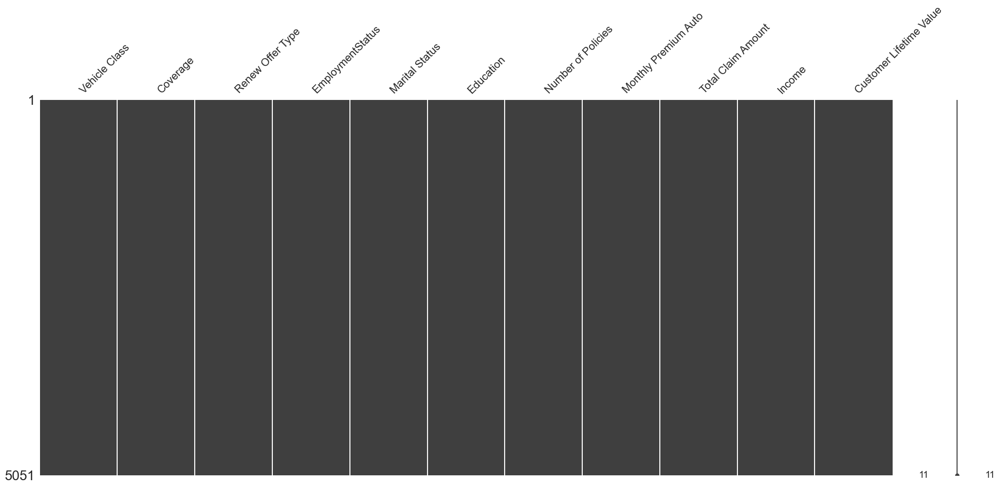

In [131]:
# missing values (NO at ALL)

msn.matrix(car_clv_insurance);

> Clearly no missing values at all, but we should still include it for the preprocess part, which anticipated of occurred values on the real data (unseen data).

## Distribution & Extreme Values (Potential Outliers)

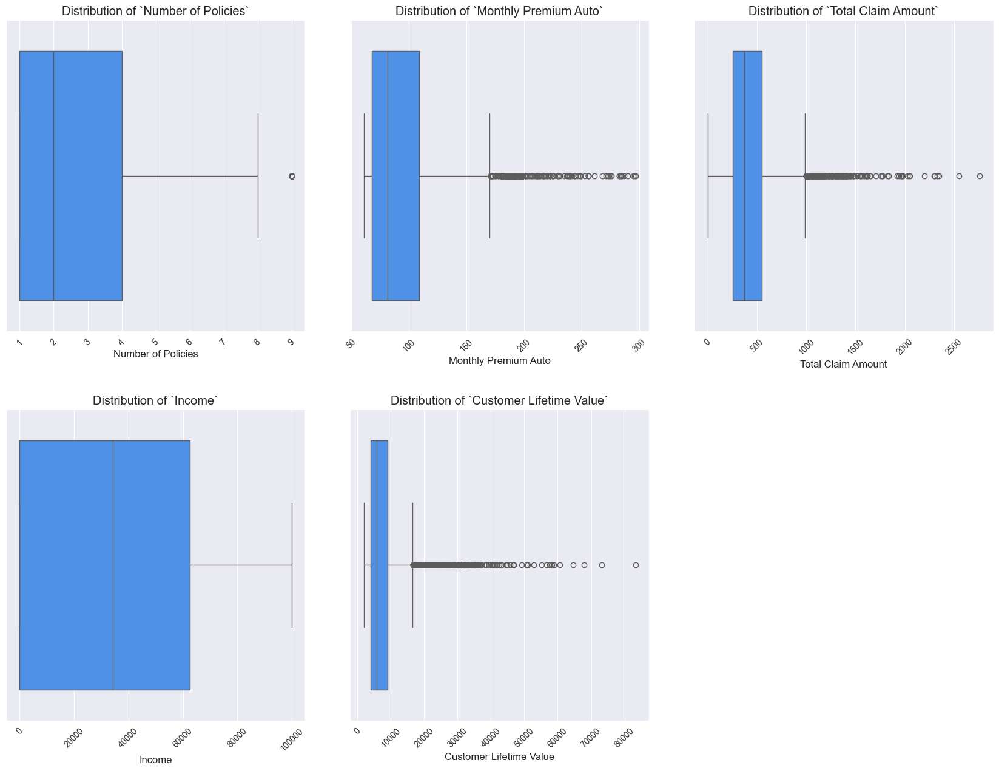

In [142]:
# Potential Outliers on Numerical Features
# ori_df = car_clv_insurance.copy()
# car_clv_insurance = ori_df.copy()

plot_distribution_outliers(car_clv_insurance)

In [5]:
# statistics about the potential outliers
# (for numerical we certainly keep the lower bound not at negative but Zero <> 0)
numerical_features = [
    'Number of Policies',
    'Monthly Premium Auto',
    'Total Claim Amount',
    'Income',
    'Customer Lifetime Value'
    ]

numerical = numerical_features.copy()

outlier_data = []

for i in numerical:
    outliers_result, lower_bound, upper_bound = calculate_outliers(car_clv_insurance, i)
    total_outlier = len(outliers_result)
    outlier_percentage = round(total_outlier / len(car_clv_insurance[i]) * 100, 2)
    outlier_data.append([i, total_outlier, outlier_percentage, lower_bound, upper_bound])

outlier_df = pd.DataFrame(outlier_data, columns=[
    'Feature', 'Total Outliers', 'Percentage (%)', 'Lower Bound (IQR)', 'Upper Bound (IQR)'
])

outlier_df

,Feature,Total Outliers,Percentage (%),Lower Bound (IQR),Upper Bound (IQR)
0,Number of Policies,228,4.51,-3.500000,8.500000
1,Monthly Premium Auto,252,4.99,6.500000,170.500000
2,Total Claim Amount,217,4.30,-192.743922,992.643348
3,Income,0,0.00,-93707.250000,156178.750000
4,Customer Lifetime Value,449,8.89,-3631.744439,16624.750075


### Before Removal Outliers

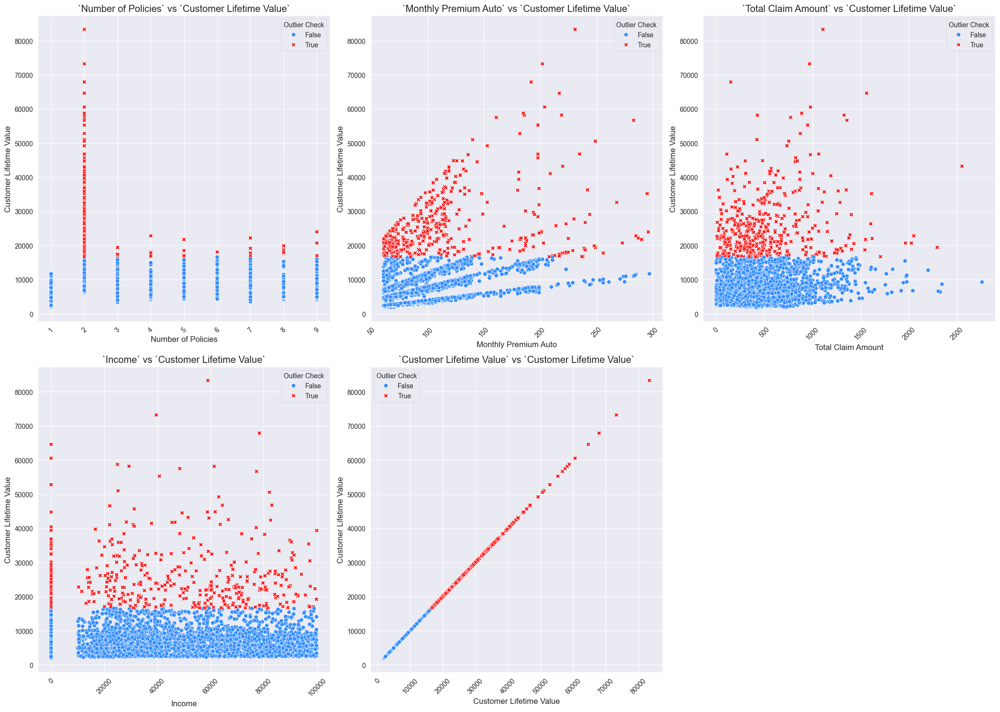

In [143]:
# Potential Outliers Numerical vs Numerical (Target)

# Give the value based on the upper_bound before = 16624.750075
clv_car_out = car_clv_insurance.copy()
clv_car_out['Outlier Check'] = clv_car_out['Customer Lifetime Value'] > 16624.750075

# List of features to plot
numerical_features = [
    'Number of Policies', 'Monthly Premium Auto',
    'Total Claim Amount', 'Income',
    'Customer Lifetime Value'
    ]

categorical_features = [
    'Vehicle Class', 'Coverage', 'Renew Offer Type',
    'EmploymentStatus', 'Marital Status', 'Education'
    ]

scatter_numerical_vs_target(
        data = clv_car_out, numerical_features = numerical_features,
        target = 'Customer Lifetime Value', hue='Outlier Check'
)

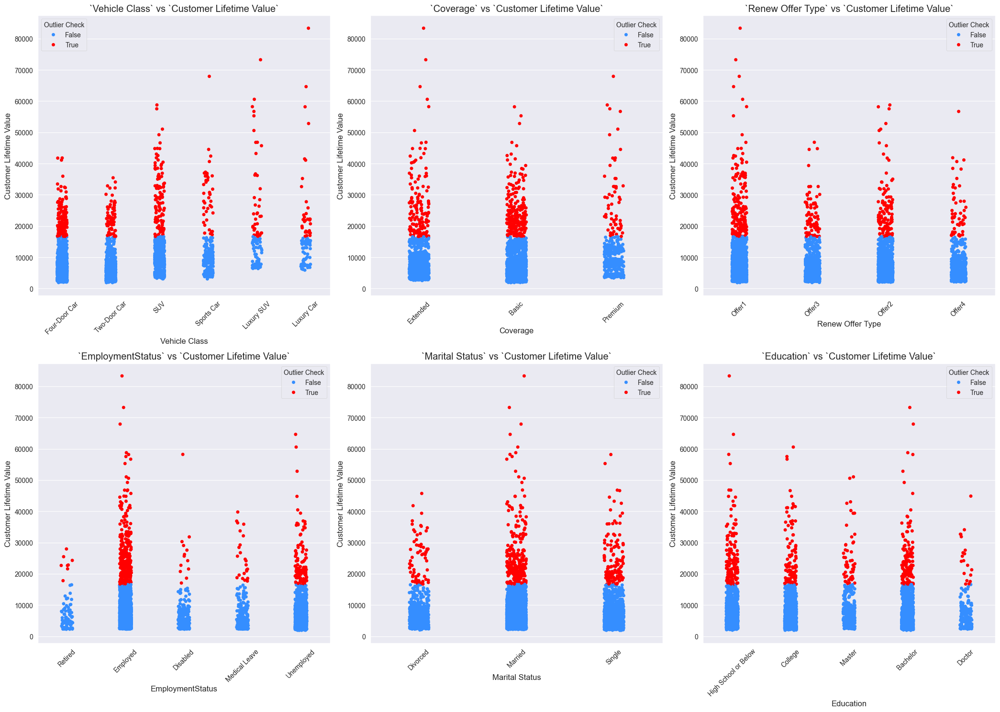

In [27]:
stripplot_categorical_vs_target(data = clv_car_out, categorical_features = categorical_features)

> Based on these information, we would consider the target (Customer Lifetime Value) below 20,000 as the focusing target of this case, and also so that it make the visualization along each numerical or categorical feature looks evenly, especially for `Number of Policies` which customer have 2 Policies (quite equal with other Policies Number).

In [13]:
car_clv_insurance['Customer Lifetime Value'].quantile(.94)

20492.7355

In [145]:
life_out['Vehicle Class'].value_counts()

Vehicle Class
Four-Door Car    103
SUV               87
Two-Door Car      52
Sports Car        34
Luxury SUV        26
Luxury Car        21
Name: count, dtype: int64

In [146]:
car_clv_insurance['Vehicle Class'].value_counts()

Vehicle Class
Four-Door Car    2462
Two-Door Car     1007
SUV               876
Sports Car        228
Luxury Car         80
Luxury SUV         75
Name: count, dtype: int64

In [150]:
(228+80+75)/len(car_clv_insurance) * 100, (34+26+21)/len(life_out) * 100

(8.10067681895093, 25.077399380804955)

### After Removal Outliers

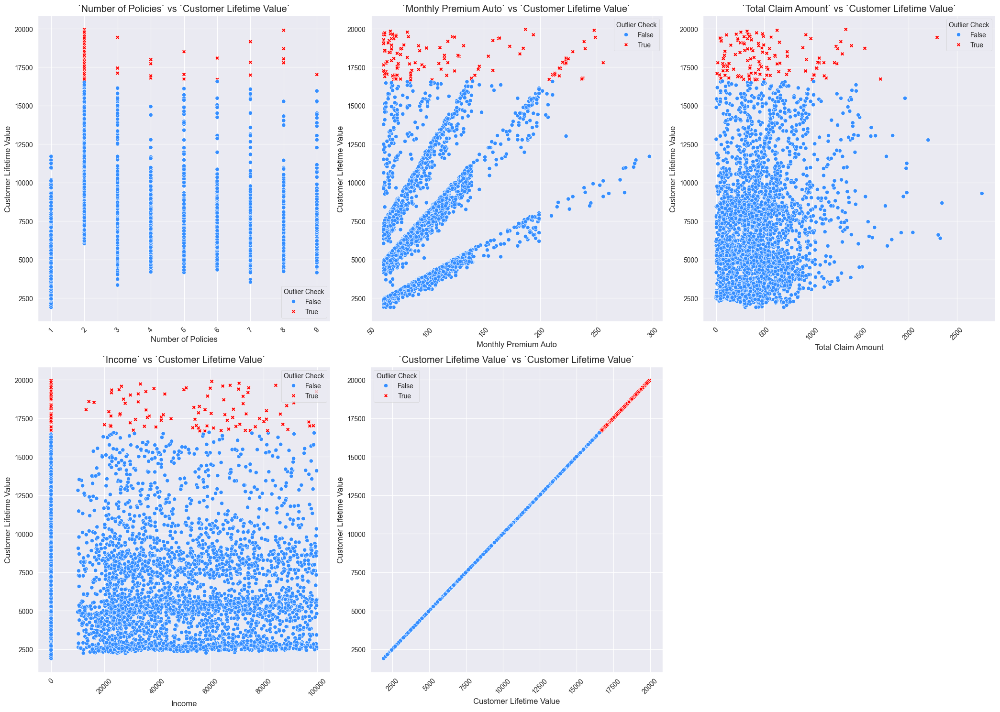

In [144]:
# removal of the potential outliers

life_out = car_clv_insurance[car_clv_insurance['Customer Lifetime Value'] >  20_000]
car_clv_insurance = car_clv_insurance[car_clv_insurance['Customer Lifetime Value'] <=  20_000]

clv_car_out_after = car_clv_insurance.copy()
clv_car_out_after['Outlier Check'] = clv_car_out_after['Customer Lifetime Value'] > 16624.750075

# out_life_rep = lifetimeval.iloc[lifetimeval[lifetimeval['Customer Lifetime Value'] > 16624.750075].index.repeat(repeats=5),:]
# lifetimeval = lifetimeval[lifetimeval['Customer Lifetime Value'] <=  16_624.750075]
# lifetimeval = pd.concat([lifetimeval, out_life_rep], axis=0).reset_index(drop=True)
# lifetimeval

# Visualization Scatter after removal
scatter_numerical_vs_target(clv_car_out_after, numerical_features)

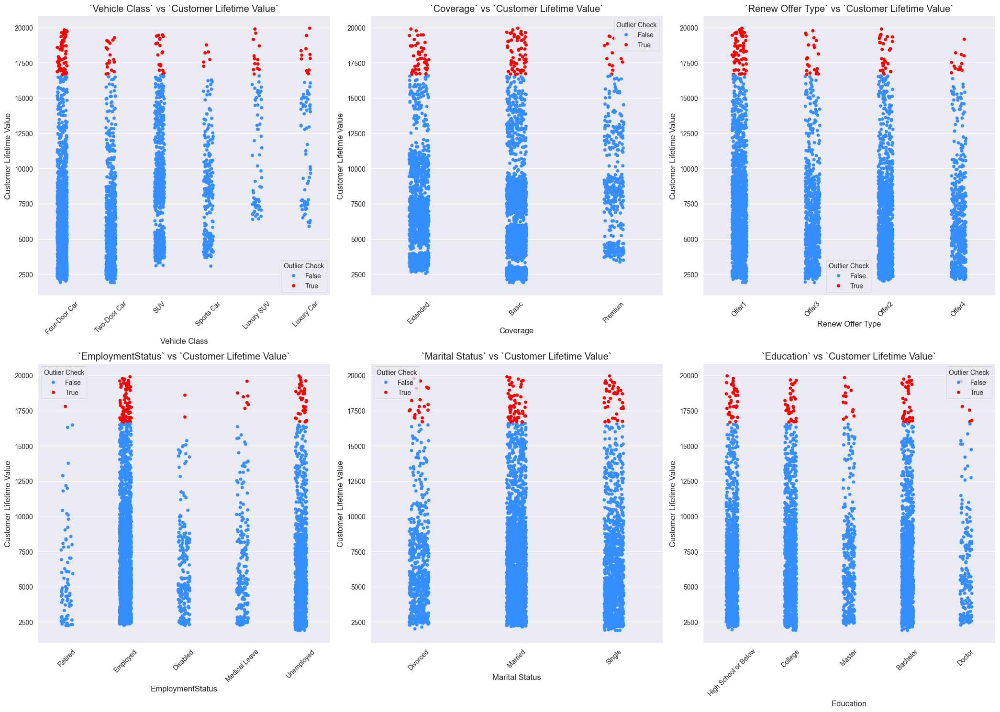

In [135]:
# visualize after removal for categorical vs target
stripplot_categorical_vs_target(clv_car_out_after, categorical_features)

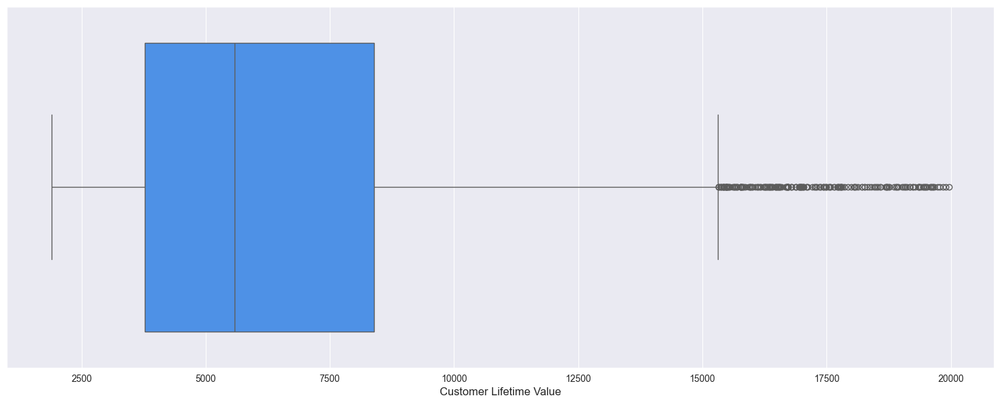

In [8]:
plt.figure(figsize= (19,7))
sns.boxplot(car_clv_insurance['Customer Lifetime Value'], orient = 'h', color = '#358EFF');

> The result of outlier's removal seems make the data more balanced along all features.

# 4. EDA 📊

## Correlation Matrix between Numerical Features

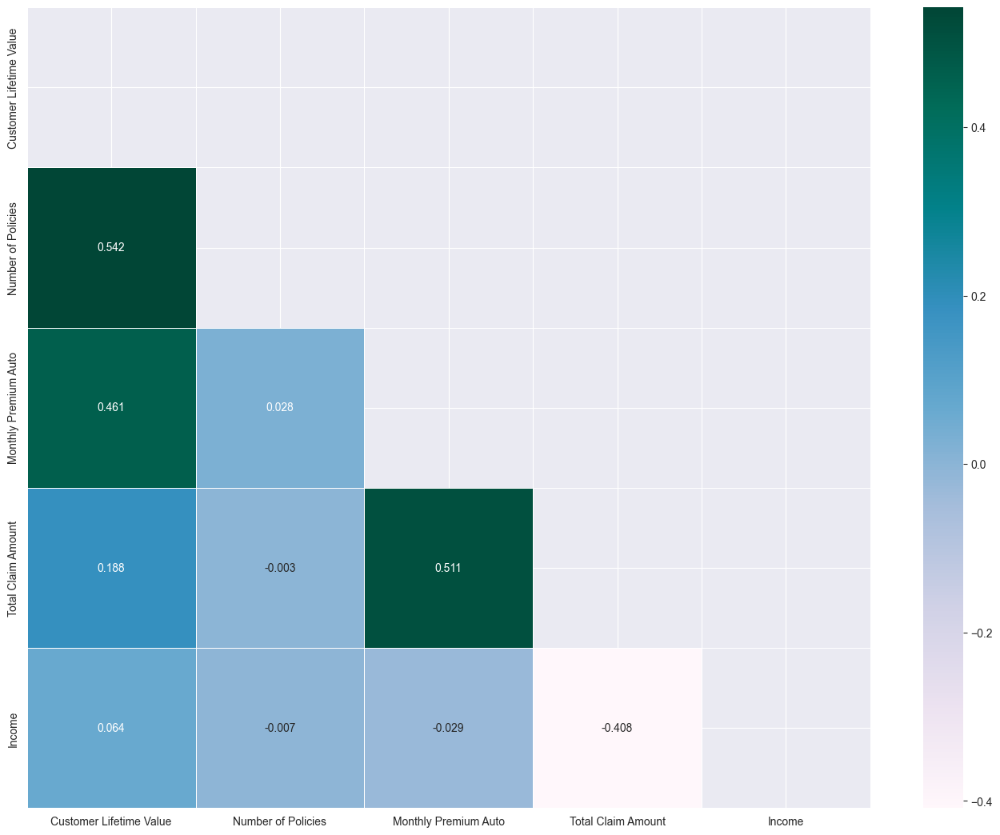

In [9]:
# check whether it might be there is some correlation between features (using spearman method because the distribution seems not normal)

numerical_features = [
    'Number of Policies',
    'Monthly Premium Auto',
    'Total Claim Amount',
    'Income',
    'Customer Lifetime Value'
    ]

corr_matrix = car_clv_insurance[numerical_features].corr(method='spearman')
matrix = np.triu(corr_matrix)

plt.figure(figsize=(17,13))
sns.heatmap(corr_matrix.sort_values(by='Customer Lifetime Value', ascending=False).sort_values(by='Customer Lifetime Value', ascending=False, axis=1), 
            cmap='PuBuGn', annot=True, linewidths= .5, fmt='.3f', mask=matrix);

# corr_matrix['Price'].sort_values(ascending=False);

> There is medium positive effect for each `Monthly Premium Auto` to `Customer Lifetime Value (CLV)` (the target) and `Total Claim Amount` to `Customer Lifetime Value` (the target), based on these if each the value on those two features increase will likely have a higher `CLV` too.

## Categorical and Customer Lifetime Value Bar

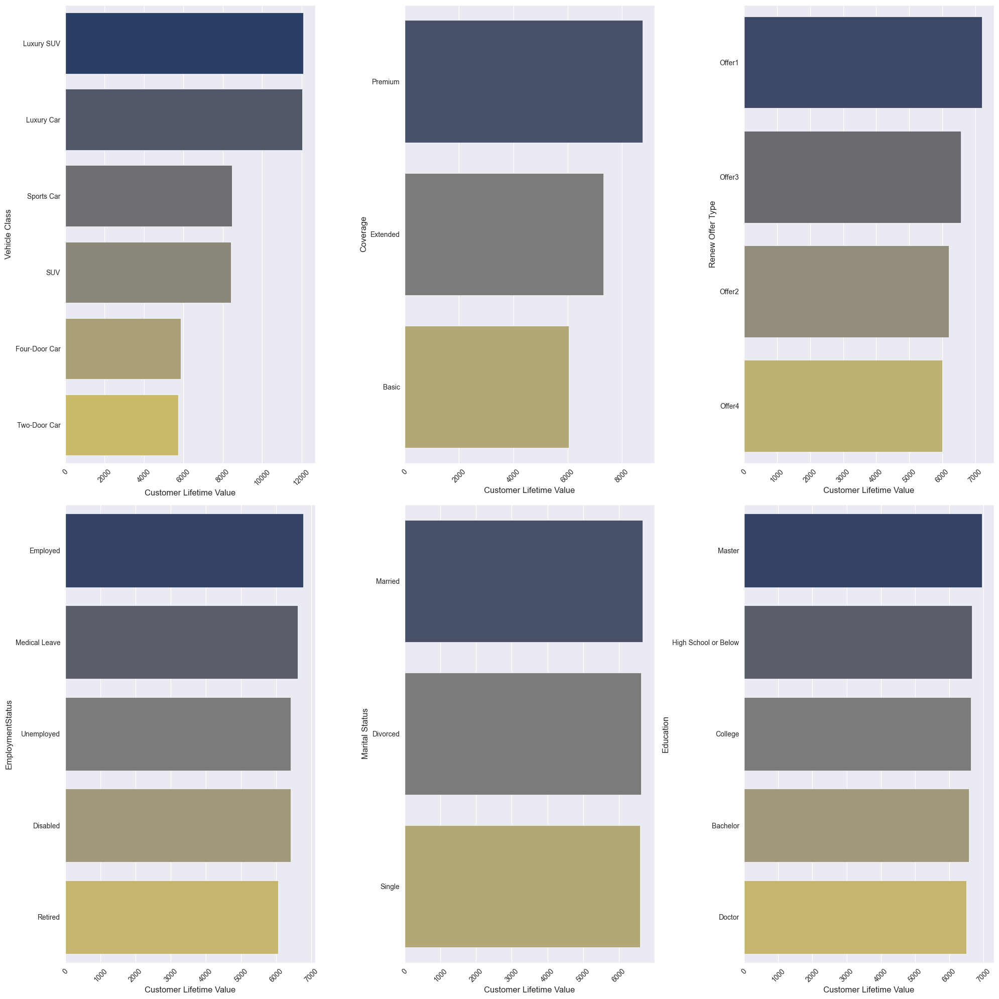

In [32]:
categorical_features  = [
        'Vehicle Class',
        'Coverage',
        'Renew Offer Type',
        'EmploymentStatus',
        'Marital Status',
        'Education'
]

fig, axes = plt.subplots(round(len(categorical_features) / 4), 3, figsize=(20, 20))

# looping to show the bar graph
for i, ax in enumerate(fig.axes):
    if i < len(categorical_features):
        # Calculate the mean Customer Lifetime Value for each category
        order = car_clv_insurance.groupby(categorical_features[i])['Customer Lifetime Value'].mean().sort_values(ascending=False).index

        # bar plot for categorical
        sns.barplot(
            data = car_clv_insurance,
            y = categorical_features[i],
            x = 'Customer Lifetime Value',
            ax = ax,
            palette = 'cividis',
            errorbar = None,
            orient = 'h',
            estimator = 'mean',
            order = order
            )
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)

# remove unnecessary canvas
for i in range(len(categorical_features), 6):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()

* Both of Luxury Type (Car & SUV) range on top based on `CLV` average, it might be indicate the customers that have each of these types will contribute to higher `CLV`.
* It also happened for the completed coverage package of car insurance --> (Premium, Extended, Basic).
* The Offer1 contribute to the highest average `CLV` on the `Renew Offer Type` for each customer.
* The Employed contribute to the highest average `CLV` on the `Employment Status` for each customer.
* Although the Married Customer contribute to the highest average `CLV` on the `Marital Status` for each customer, but there is no quite significant difference with other customer status.
* The Customer whom hold Master Degree contribute to the highest average `CLV` on the `Employment Status` for each customer.

# 5. Splitting Data

In [33]:
# show all features (total: 11)

car_clv_insurance.columns.to_list(), len(car_clv_insurance.columns.to_list())

(['Vehicle Class',
  'Coverage',
  'Renew Offer Type',
  'EmploymentStatus',
  'Marital Status',
  'Education',
  'Number of Policies',
  'Monthly Premium Auto',
  'Total Claim Amount',
  'Income',
  'Customer Lifetime Value'],
 11)

In [34]:
RANDOM_STATE

233

In [10]:
# feature selection and splitting

X = car_clv_insurance.drop(columns='Customer Lifetime Value')
y = car_clv_insurance['Customer Lifetime Value']

# split
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size = .2,
    random_state = RANDOM_STATE
)

X_train.shape, X_test.shape

((3782, 10), (946, 10))

In [11]:
X_test.to_csv('car_insurance_real.csv', index=False)

# 6. Feature Engineering

In [105]:
car_clv_insurance.head(1)

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
0,Four-Door Car,Extended,Offer1,Retired,Divorced,High School or Below,2.0,90.0,571.479602,11828.0,10083.48688


In [106]:
car_clv_insurance['Education'].unique()

array(['High School or Below', 'College', 'Master', 'Bachelor', 'Doctor'],
      dtype=object)

## Transformed Process

* SimpleImputer: Handles missing values by imputing them with a specified strategy (e.g., mean, median, mode).
* OneHotEncoder: Converts categorical features into a one-hot numeric array.
* OrdinalEncoder: Converts categorical features to numerical values based on their ordinal position.
* RobustScaler: Scales features using statistics that are robust to outliers (i.e., using the median and the interquartile range).

In [12]:
# defining the features
nominal_features = ['Vehicle Class', 'EmploymentStatus', 'Marital Status']
ordinal_features = ['Education', 'Coverage']
edu_ordered_cat = ['High School or Below', 'College', 'Bachelor', 'Master', 'Doctor']
coverage_ordered_cat = ['Basic', 'Extended', 'Premium']
numerical_features = ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income']

# define some pipelines
pipeline_nominal = Pipeline([
        ('imputer_mode', SimpleImputer(strategy = 'most_frequent', add_indicator = True)), # impute if any missng values
        ('onehot_encoding', OneHotEncoder(drop = 'first', dtype = int)) # encoding 
    ])

pipeline_ordinal = Pipeline([
        ('imputer_mode', SimpleImputer(strategy = 'most_frequent', add_indicator = True)), # impute if any missng values
        ('ordinal_encoding', OrdinalEncoder(categories=[edu_ordered_cat, coverage_ordered_cat])) # encoding 
    ])

pipeline_numerical = Pipeline([
        ('imputer_median', SimpleImputer(strategy = 'median', add_indicator = True)), # impute if any missng values
         # ('poly', PolynomialFeatures(degree=2, include_bias=False)), # poly
        ('numerical_scaling', RobustScaler()) # encoding 
    ])

# define pipeline for some thing to do
transformer = ColumnTransformer([
    ('nominal_preprocess', pipeline_nominal, nominal_features),
    ('ordinal_preprocess', pipeline_ordinal, ordinal_features),
    ('numerical_preprocess', pipeline_numerical, numerical_features)
])

transformer_tree = ColumnTransformer([
    ('nominal_preprocess', pipeline_nominal, nominal_features),
    ('ordinal_preprocess', pipeline_ordinal, ordinal_features),
    ('numerical_preprocess', SimpleImputer(strategy = 'median', add_indicator = True), numerical_features)
])

transformer.fit(X_train)
transformer_tree.fit(X_train)

# clean result formatting feature's name
features = list(transformer.get_feature_names_out())

list_features = []
for feature in features:
    list_features.append(''.join(feature.split('__')[-1]))

# show the result of transformation
transform_results_df = pd.DataFrame(
    transformer.transform(X_train),
    columns = list_features,
    # columns = features
    )

transform_results_tree_df = pd.DataFrame(
    transformer_tree.transform(X_train),
    columns = list_features,
    # columns = features
    )

display(
    transform_results_df,
    transform_results_tree_df
)

,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Marital Status_Married,Marital Status_Single,Education,Coverage,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,-0.153846,-0.310625,0.534888
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,-0.333333,-0.282051,-0.227897,0.060444
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.333333,-0.487179,-1.214204,1.001679
3,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.333333,-0.153846,-0.808630,0.223371
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,2.0,-0.333333,0.589744,0.429736,0.418595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3777,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,1.0,-0.333333,0.307692,-0.390540,0.491167
3778,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.000000,-0.410256,-0.460891,0.433320
3779,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,-0.333333,-0.358974,-0.592824,-0.003131
3780,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,2.000000,0.846154,-0.397958,0.455278


,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Marital Status_Married,Marital Status_Single,Education,Coverage,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,74.0,275.608537,67197.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,69.0,300.056383,37876.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,61.0,8.582971,96045.0
3,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,3.0,74.0,128.438230,47945.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,2.0,1.0,103.0,494.400000,60010.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3777,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,1.0,1.0,92.0,251.992083,64495.0
3778,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,64.0,231.201886,60920.0
3779,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,1.0,66.0,192.213037,33947.0
3780,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,8.0,113.0,249.799752,62277.0


## Preprocessed Data

In [13]:
# result of transformed train data
transform_X_train_df = pd.DataFrame(
    transformer.transform(X_train),
    columns = list_features
    )

transform_X_train_tree_df = pd.DataFrame(
    transformer_tree.transform(X_train),
    columns = list_features
    )

# result of transformed test data
transform_X_test_df = pd.DataFrame(
    transformer.transform(X_test),
    columns = list_features
    )

transform_X_test_tree_df = pd.DataFrame(
    transformer_tree.transform(X_test),
    columns = list_features
    )

display(
    transform_X_train_df.shape, transform_X_train_tree_df.shape,
    transform_X_test_df.shape, transform_X_test_tree_df.shape
)

(3782, 17)

(3782, 17)

(946, 17)

(946, 17)

## Feature Selection (RFECV)

In [14]:
# fold for cross valitadion
kfold_cv = KFold(n_splits = 5, shuffle = True, random_state = RANDOM_STATE) #stratified for classification
# StratifiedKFold()
# RFE to select features number based on feature importance
selector_features = RFECV(
    estimator = XGBRegressor(random_state=RANDOM_STATE, n_jobs = -1),
    # estimator = RandomForestRegressor(criterion = 'absolute_error', random_state = RANDOM_STATE),
    cv = kfold_cv,
    scoring = 'r2',
    min_features_to_select=9,
    step = 1
)
selector_features = selector_features.fit(transform_X_train_tree_df, y_train)

In [15]:
pd.DataFrame(selector_features.cv_results_).sort_values(by='mean_test_score', ascending=False).iloc[:6]

,mean_test_score,std_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,n_features
2,0.816225,0.015517,0.824937,0.839713,0.795706,0.803787,0.816981,11
8,0.813011,0.014029,0.820670,0.836256,0.797833,0.801201,0.809098,17
4,0.811210,0.015140,0.826018,0.826717,0.794135,0.792199,0.816981,13
3,0.810284,0.013594,0.814764,0.827982,0.787716,0.804104,0.816857,12
1,0.810074,0.015073,0.818525,0.830657,0.789078,0.796896,0.815213,10
7,0.809574,0.014255,0.806598,0.834824,0.793566,0.799596,0.813285,16


In [16]:
# the selected features to show
rfe_result = pd.DataFrame({
    'Feature': transform_X_train_df.columns,
    'Selected': selector_features.support_,
    'Ranking': selector_features.ranking_
}).sort_values(by='Ranking')

df_selected = rfe_result[rfe_result['Selected']]
features_selected = df_selected['Feature'].values
df_selected

,Feature,Selected,Ranking
8,EmploymentStatus_Unemployed,True,1
14,Monthly Premium Auto,True,1
13,Number of Policies,True,1
11,Education,True,1
10,Marital Status_Single,True,1
9,Marital Status_Married,True,1
15,Total Claim Amount,True,1
16,Income,True,1
6,EmploymentStatus_Medical Leave,True,1
5,EmploymentStatus_Employed,True,1


> Based on this information, although the best model should only use 11 features (mainly after preprocessed), but we would proceed with all 17 features the 2nd one, to be aligned with our goals.

## New Transformation After Selection

In [293]:
features_selected, len(features_selected)

(array(['EmploymentStatus_Unemployed', 'Monthly Premium Auto',
        'Number of Policies', 'Education', 'Marital Status_Single',
        'Marital Status_Married', 'Total Claim Amount', 'Income',
        'EmploymentStatus_Medical Leave', 'EmploymentStatus_Employed',
        'Vehicle Class_Two-Door Car'], dtype=object),
 11)

In [17]:
# Custom transformer to select certain columns after preprocessing
class ColumnSelector(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        # clean result formatting feature's name
        features = list(transformer.get_feature_names_out())
        
        list_features = []
        for feature in features:
            list_features.append(''.join(feature.split('__')[-1]))
            
        self.feature_names_ = list_features
    
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Ensure X is a DataFrame to facilitate column selection
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=self.feature_names_)
        return X[self.columns]

# Combined pipeline with ColumnSelector
pipe_transformer = Pipeline(steps=[
    ('transformer', transformer),
    ('selector', ColumnSelector(columns = features_selected))  # Select columns after preprocessing
])

pipe_transformer_tree = Pipeline(steps=[
    ('transformer', transformer_tree),
    ('selector', ColumnSelector(columns = features_selected))  # Select columns after preprocessing
])

# clean result formatting feature's name
features = list(transformer.get_feature_names_out())

list_features = []
for feature in features:
    list_features.append(''.join(feature.split('__')[-1]))

# assign feature name after transformation preprocess
# pipe_transformer.named_steps['selector'].set_feature_names(list_features)
# pipe_transformer_tree.named_steps['selector'].set_feature_names(list_features)

# fit the new transformer
pipe_transformer.fit(X_train)
pipe_transformer_tree.fit(X_train)

# show the result of transformation
transform_results_rfe_df = pd.DataFrame(
    pipe_transformer.transform(X_train)
    )

transform_results_rfe_tree_df = pd.DataFrame(
    pipe_transformer_tree.transform(X_train)
    )

display(
    transform_results_rfe_df,
    transform_results_rfe_tree_df
)

,EmploymentStatus_Unemployed,Monthly Premium Auto,Number of Policies,Education,Marital Status_Single,Marital Status_Married,Total Claim Amount,Income,EmploymentStatus_Medical Leave,EmploymentStatus_Employed,Vehicle Class_Two-Door Car
0,0.0,-0.153846,0.000000,0.0,0.0,0.0,-0.310625,0.534888,0.0,1.0,1.0
1,0.0,-0.282051,-0.333333,1.0,1.0,0.0,-0.227897,0.060444,0.0,1.0,0.0
2,0.0,-0.487179,-0.333333,1.0,0.0,0.0,-1.214204,1.001679,0.0,1.0,0.0
3,0.0,-0.153846,0.333333,3.0,0.0,1.0,-0.808630,0.223371,0.0,1.0,1.0
4,0.0,0.589744,-0.333333,3.0,0.0,1.0,0.429736,0.418595,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
3777,0.0,0.307692,-0.333333,2.0,0.0,1.0,-0.390540,0.491167,0.0,1.0,0.0
3778,0.0,-0.410256,0.000000,1.0,1.0,0.0,-0.460891,0.433320,0.0,1.0,1.0
3779,0.0,-0.358974,-0.333333,4.0,0.0,1.0,-0.592824,-0.003131,0.0,1.0,0.0
3780,0.0,0.846154,2.000000,3.0,1.0,0.0,-0.397958,0.455278,0.0,1.0,0.0


,EmploymentStatus_Unemployed,Monthly Premium Auto,Number of Policies,Education,Marital Status_Single,Marital Status_Married,Total Claim Amount,Income,EmploymentStatus_Medical Leave,EmploymentStatus_Employed,Vehicle Class_Two-Door Car
0,0.0,74.0,2.0,0.0,0.0,0.0,275.608537,67197.0,0.0,1.0,1.0
1,0.0,69.0,1.0,1.0,1.0,0.0,300.056383,37876.0,0.0,1.0,0.0
2,0.0,61.0,1.0,1.0,0.0,0.0,8.582971,96045.0,0.0,1.0,0.0
3,0.0,74.0,3.0,3.0,0.0,1.0,128.438230,47945.0,0.0,1.0,1.0
4,0.0,103.0,1.0,3.0,0.0,1.0,494.400000,60010.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
3777,0.0,92.0,1.0,2.0,0.0,1.0,251.992083,64495.0,0.0,1.0,0.0
3778,0.0,64.0,2.0,1.0,1.0,0.0,231.201886,60920.0,0.0,1.0,1.0
3779,0.0,66.0,1.0,4.0,0.0,1.0,192.213037,33947.0,0.0,1.0,0.0
3780,0.0,113.0,8.0,3.0,1.0,0.0,249.799752,62277.0,0.0,1.0,0.0


## Preprocessed After Selection

In [18]:
# result of transformed train data
transform_X_train_rfe_df = pd.DataFrame(
    pipe_transformer.transform(X_train)
    )

transform_X_train_rfe_tree_df = pd.DataFrame(
    pipe_transformer_tree.transform(X_train)
    )

# result of transformed test data
transform_X_test_rfe_df = pd.DataFrame(
    pipe_transformer.transform(X_test)
    )

transform_X_test_rfe_tree_df = pd.DataFrame(
    pipe_transformer_tree.transform(X_test)
    )

display(
    transform_X_train_rfe_df.shape, transform_X_train_rfe_tree_df.shape,
    transform_X_test_rfe_df.shape, transform_X_test_rfe_tree_df.shape
)

(3782, 11)

(3782, 11)

(946, 11)

(946, 11)

# 7. Modelling (Multiple Regression)

## Define New Metrics

| Metric Name | Function | Description |
| --- | --- | --- |
| Adjusted R² Score  | How well the model fits the data, adjusting for the number of predictors to prevent overfitting. | A statistical measure that indicates how well a regression model explains the variability of the dependent variable (y) by the independent variables (x), adjusting for the number of predictors in the model. Unlike R², which can only increase when more predictors are added, Adjusted R² can decrease if the additional predictors do not improve the model sufficiently. This adjustment prevents overfitting and provides a more accurate assessment of the model’s performance. |
| Mean Absolute Percentage Error (MAPE) | How accurate the model’s predictions are on average, relative to the actual values. | It represents the average absolute percentage difference between actual values and predicted values. MAPE is expressed as a percentage, making it easy to interpret the magnitude of prediction errors relative to the actual values. |

In [19]:
# Calculate Adjusted R² score
def adjusted_r2_score(y_true, y_pred, X):
    r2 = r2_score(y_true, y_pred)
    n = X.shape[0]
    p = X.shape[1]
    if n <= p + 1:
        return np.nan  # Avoid division by zero or negative values in the denominator
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    return adjusted_r2

# Wrapper function for make_scorer
def adjusted_r2_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return adjusted_r2_score(y, y_pred, X)

# Create the cus?scorer(adjusted_r2_scorer, greater_is_better=True)

# adjusted_r2 = 1 - (1 - r2) * (len(y) - 1) / (len(y) - x_transformed_df.shape[1] - 1)

# r2 = r2_score(Y, ols_pred_results)

# Define the adjusted R² score class
class AdjustedR2Score:
    def __init__(self, n, p):
        self.n = n
        self.p = p
    
    def __call__(self, y_true, y_pred):
        r2 = r2_score(y_true, y_pred)
        adjusted_r2 = 1 - (1 - r2) * (self.n - 1) / (self.n - self.p - 1)
        return adjusted_r2
    
    def __name__(self):
        return 'adjusted_r2_score'

# Initialize the custom adjusted R² score with the number of samples and features
n_samples, n_features = X_train.shape
adjusted_r2_scorer = AdjustedR2Score(n_samples, n_features)

# Create the scorer
adjusted_r2 = make_scorer(adjusted_r2_scorer, greater_is_better=True)

## Linear Models

### OLS Linear Regression

In [20]:
# transformed the dataset
df_X_transformed = pd.DataFrame(
    pipe_transformer.transform(car_clv_insurance.drop(columns='Customer Lifetime Value')),
    # columns = list_features
    )

# define the x and y
Y = car_clv_insurance['Customer Lifetime Value'].reset_index(drop=True)
X = sm.add_constant(df_X_transformed.reset_index(drop=True))

# execute
sm_lm_ols = sm.OLS(Y, X)
result_ols = sm_lm_ols.fit()

# the prediction result
ols_pred_results = result_ols.fittedvalues

# show the summary
print(result_ols.summary())

                               OLS Regression Results                              
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.244
Model:                                 OLS   Adj. R-squared:                  0.243
Method:                      Least Squares   F-statistic:                     138.7
Date:                     Wed, 17 Jul 2024   Prob (F-statistic):          5.58e-277
Time:                             21:48:03   Log-Likelihood:                -45004.
No. Observations:                     4728   AIC:                         9.003e+04
Df Residuals:                         4716   BIC:                         9.011e+04
Df Model:                               11                                         
Covariance Type:                 nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

In [21]:
display(
    mean_absolute_error(Y, ols_pred_results),
    root_mean_squared_error(Y, ols_pred_results),
    mean_absolute_percentage_error(Y, ols_pred_results),
    r2_score(Y, ols_pred_results),
    adjusted_r2_score(Y, ols_pred_results, X)
)

2394.649093952091

3293.087239093519

0.4274353603149362

0.24438116017432387

0.24245805814295418

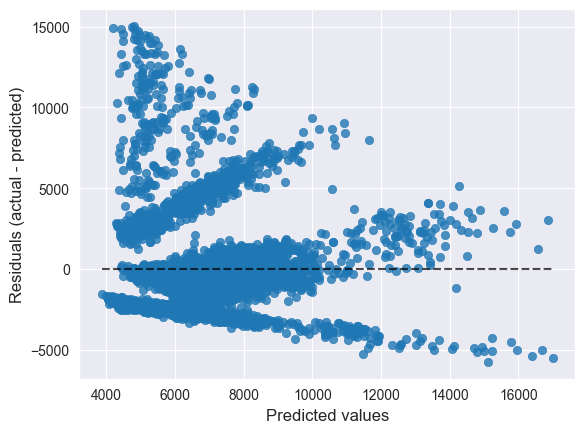

In [22]:
PredictionErrorDisplay(y_true = Y, y_pred = ols_pred_results).plot();

### Check Assumptions

#### Residual Analysis (should be normal distributed)

In [23]:
from scipy.stats import kstest
from statsmodels.stats.diagnostic import lilliefors
from scipy.stats import shapiro
from scipy.stats import normaltest

residual_linear_res = result_ols.resid

ks_statistic, ks_pvalue = kstest(residual_linear_res, 'norm')

if ks_pvalue > 0.05:
    print(f'P-Value: {ks_pvalue}. So, we assume a normal distribution')
else: 
    print(f'P-Value: {ks_pvalue}. So, we do not assume a normal distribution ❌')

lf_statistic, lf_pvalue = lilliefors(residual_linear_res)

if lf_pvalue > 0.05:
    print(f'P-Value: {lf_pvalue}. So, we assume a normal distribution')
else: 
    print(f'P-Value: {lf_pvalue}. So, we do not assume a normal distribution ❌')

sw_statistic, sw_pvalue = shapiro(residual_linear_res)

if sw_pvalue > 0.05:
    print(f'P-Value: {sw_pvalue}. So, we assume a normal distribution')
else: 
    print(f'P-Value: {sw_pvalue}. So, we do not assume a normal distribution ❌')

dp_statistic, df_pvalue = normaltest(residual_linear_res)

if df_pvalue > 0.05:
    print(f'P-Value: {df_pvalue}. So, we assume a normal distribution')
else: 
    print(f'P-Value: {df_pvalue}. So, we do not assume a normal distribution ❌')

skew_value = residual_linear_res.skew()
if skew_value > 0:
    print(f'skewness: {skew_value} - Right Skew -->')
else:
    print(f'skewness: {skew_value} - Left Skew <--')

P-Value: 0.0. So, we do not assume a normal distribution ❌
P-Value: 0.0009999999999998899. So, we do not assume a normal distribution ❌
P-Value: 7.338390063340404e-58. So, we do not assume a normal distribution ❌
P-Value: 0.0. So, we do not assume a normal distribution ❌
skewness: 1.7725020508397293 - Right Skew -->


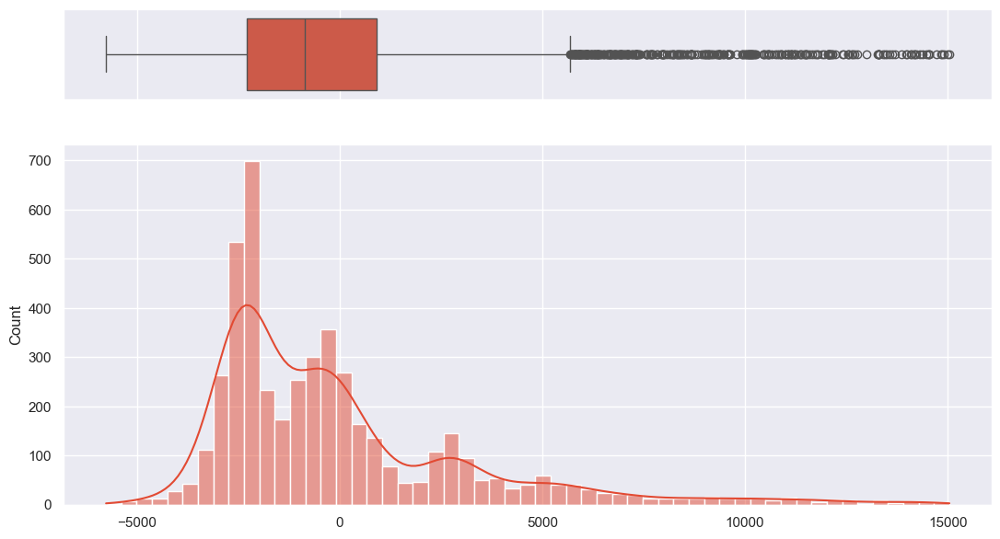

In [334]:
# normality assumption

# Set up the figure and axis
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (0.2, 0.8)}, figsize = (13,7))
# plt.figure(figsize = (7,7))

sns.set_context('notebook', font_scale=1)

# Add a boxplot on the top axis
sns.boxplot(x=result_ols.resid, ax=ax_box, orient='h')

# Add a histogram on the bottom axis
sns.histplot(result_ols.resid, kde=True, ax=ax_hist)
# plt.xlabel('Residual', fontsize=20);

# Remove x-axis labels from the boxplot for clarity
ax_box.set(xlabel='Residual')

# Show the plot
plt.show()

# plt.figure(figsize = (7,7))

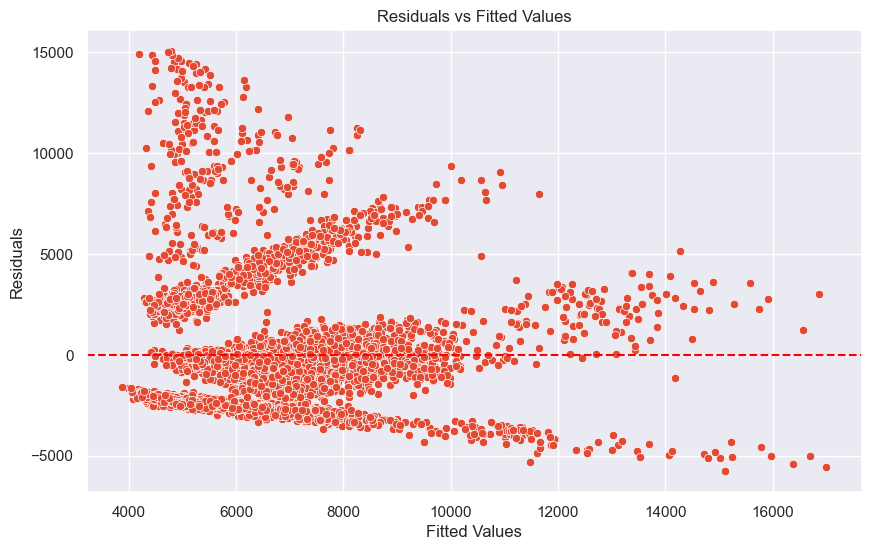

In [335]:
# Plot residuals vs fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=result_ols.fittedvalues, y=result_ols.resid)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

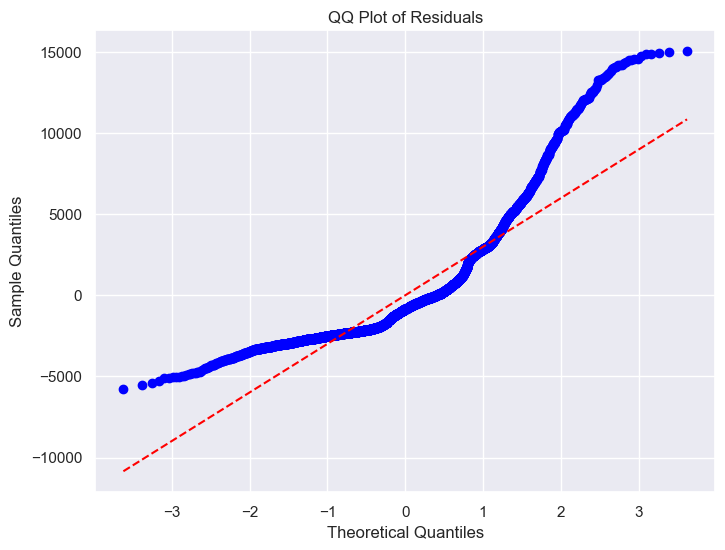

In [336]:
# # QQPlot

# sm.qqplot(result_ols.resid, line='45')
# plt.title('QQ Plot of Residuals')

# # Set the limits to zoom in
# plt.xlim(-4, 4)  # Zoom in on the x-axis (theoretical quantiles)
# # plt.ylim(12000, -24000) # Zoom in on the y-axis (sample quantiles)

# plt.show()

from scipy import stats

fig, ax = plt.subplots(figsize=(8, 6))

res = stats.probplot(result_ols.resid, dist="norm", plot=ax)

# Customizing the plot
ax.get_lines()[0].set_markerfacecolor('b')  # Change the color of the points
ax.get_lines()[1].set_color('r')            # Change the color of the line
ax.get_lines()[1].set_linestyle('--')       # Change the line style

ax.set_title('QQ Plot of Residuals')
ax.set_xlabel('Theoretical Quantiles')
ax.set_ylabel('Sample Quantiles')

plt.grid(True)
plt.show();

#### Multicollinearity check ✅

In [337]:
transform_results_df.columns

Index(['EmploymentStatus_Unemployed', 'Monthly Premium Auto',
       'Number of Policies', 'Education', 'Marital Status_Single',
       'Marital Status_Married', 'Total Claim Amount', 'Income',
       'EmploymentStatus_Medical Leave', 'EmploymentStatus_Employed',
       'Vehicle Class_Two-Door Car'],
      dtype='object')

In [24]:
# Multicollinearity check ✅

def calc_vif(X):
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

# num_processed = transform_results_df[['Number of Policies',
#        'Monthly Premium Auto', 'Total Claim Amount', 'Income',
#        'Number of Policies^2', 'Number of Policies Monthly Premium Auto',
#        'Number of Policies Total Claim Amount', 'Number of Policies Income',
#        'Monthly Premium Auto^2', 'Monthly Premium Auto Total Claim Amount',
#        'Monthly Premium Auto Income', 'Total Claim Amount^2',
#        'Total Claim Amount Income', 'Income^2']]
# calc_vif(num_processed)

calc_vif(transform_results_df[[
    'Number of Policies','Monthly Premium Auto', 'Total Claim Amount', 'Income'
]])

,variables,VIF
0,Number of Policies,1.020455
1,Monthly Premium Auto,1.820411
2,Total Claim Amount,2.042783
3,Income,1.249924


In [25]:
calc_vif(transform_results_df)

,variables,VIF
0,Vehicle Class_Luxury Car,6.853875
1,Vehicle Class_Luxury SUV,5.838071
2,Vehicle Class_SUV,8.288946
3,Vehicle Class_Sports Car,2.814273
4,Vehicle Class_Two-Door Car,1.389071
5,EmploymentStatus_Employed,7.996225
6,EmploymentStatus_Medical Leave,1.379389
7,EmploymentStatus_Retired,1.121545
8,EmploymentStatus_Unemployed,4.385820
9,Marital Status_Married,4.672065


In [26]:
calc_vif(transform_results_df.drop(columns=[
    'EmploymentStatus_Retired', 'EmploymentStatus_Medical Leave',
    'EmploymentStatus_Unemployed','Vehicle Class_Luxury Car',
    'Marital Status_Single']))

,variables,VIF
0,Vehicle Class_Luxury SUV,1.679769
1,Vehicle Class_SUV,2.085241
2,Vehicle Class_Sports Car,1.273286
3,Vehicle Class_Two-Door Car,1.333780
4,EmploymentStatus_Employed,4.721533
5,Marital Status_Married,2.473419
6,Education,2.186958
7,Coverage,2.238211
8,Number of Policies,1.161947
9,Monthly Premium Auto,4.336546


### Insights on Linear Models

Based on the OLS method above we got the Adjusted R² score of below 50%, and it does not pass the assumptions to be using the linear models. Moreover, the linear models possibly not the best one to be used on this case, but later on, these models would still be compared to each other for evidence that it performs worst on this data.

### The List of Linear Models

| Model Name | Description | Point to Consider |
| --- | --- | --- |
| Linear Regression | A simple and widely used statistical method for predicting the value of a dependent variable (y) based on the value of one or more independent variables (x). The model assumes a linear relationship between the input variables and the output variable. | * Assumptions: Linearity, independence, homoscedasticity, normality of errors. <br>* Use: Basic predictive modeling and establishing relationships between variables. |
| Ridge Regression | A type of linear regression that includes a regularization term to prevent overfitting. It adds a penalty equivalent to the square of the magnitude of coefficients. | * Penalty: L2 norm (squared sum of coefficients). <br>* Use: When multicollinearity is present in the data. |
| Lasso Regression | (Least Absolute Shrinkage and Selection Operator) is a type of linear regression that performs both variable selection and regularization. It adds a penalty equivalent to the absolute value of the magnitude of coefficients. | * Penalty: L1 norm (sum of absolute values of coefficients). <br>* Use: When you need feature selection and regularization. |
| Huber Regression | A robust regression method that combines the properties of least squares and absolute error loss functions. It is less sensitive to outliers than standard linear regression. | * Loss Function: Huber loss, which is quadratic for small errors and linear for large errors. <br>* Use: When the data contains outliers. |
| TheilSen Regression | A robust method for linear regression that calculates the median of slopes of all possible pairs of points. It is less sensitive to outliers than ordinary least squares regression. | * Robustness: High resistance to outliers. <br>* Use: When the data contains outliers and is not normally distributed. |
| Quantile Regression | It estimates the conditional quantiles of the response variable, providing a more complete view of the possible outcomes. It is useful for understanding the distributional effects of predictors. | * Flexibility: Can model different quantiles (e.g., median, upper quartile). <br>* Use: When interested in different points of the outcome distribution. |
| RANSAC Regression | (RANdom SAmple Consensus) Regression is an iterative method for estimating parameters of a model that is robust to outliers. It fits the model to random subsets of the data and selects the best model based on consensus. | * Robustness: High resistance to outliers. <br>* Use: When the dataset contains a significant number of outliers. |

In [27]:
# define some linear models

linear_models = {
    'Linear Regression' : LinearRegression(n_jobs = -1),
    'Ridge Regression': Ridge(max_iter = 10_000, random_state = RANDOM_STATE),
    'Lasso Regression': Lasso(max_iter = 10_000, random_state = RANDOM_STATE),
    'Huber Regression': HuberRegressor(max_iter = 1000),
    'TheilSen Regression': TheilSenRegressor(max_iter = 1000, random_state = RANDOM_STATE),
    'Quantile Regression': QuantileRegressor(),
    'RANSAC Regression': RANSACRegressor(max_trials = 1000, random_state = RANDOM_STATE)
}

## Non-Linear Models

| Model Name | Description | Point to Consider |
| --- | --- | --- |
| Decision Tree Regression | A non-linear model that splits the data into subsets based on feature values to make predictions. Each split is chosen to maximize the reduction in variance in the target variable. | * Interpretability: Easy to interpret and visualize. <br>* Use: When relationships between features and target are non-linear. |
| Random Forest Regression | An ensemble method that combines multiple decision trees to improve prediction accuracy and control overfitting. Each tree is trained on a random subset of the data. | * Ensemble: Reduces variance and improves generalization. <br>* Use: When seeking robust and accurate predictions. |
| Gradient Boosting Regression | An ensemble technique that builds models sequentially, each one correcting the errors of the previous ones. It uses a gradient descent algorithm to minimize the loss function. | * Boosting: Sequentially improves model performance. <br>* Use: When high prediction accuracy is required. |
| K-Nearest Neighbors (KNN) Regression | A non-parametric method that predicts the target value based on the average of the k-nearest neighbors in the feature space. | * Simplicity: Easy to understand and implement. <br>* Use: When the relationship between features and target is highly non-linear. |
| Support Vector Machine (SVM) Regression | Also known as Support Vector Regression (SVR), aims to find a function that deviates from the true targets by a value no greater than a specified margin, and at the same time is as flat as possible. | * Margin-based: Balances model complexity and error tolerance. <br>* Use: When dealing with high-dimensional data. |
| Xtreme Gradient Boosting (XGBoost) Regression | An optimized implementation of gradient boosting that is designed to be highly efficient, flexible, and portable. It includes advanced regularization. | * Performance: High accuracy and speed. <br>* Use: When you need a powerful and scalable model. |
| Light Gradient-Boosting Machine (LGBM) Regression | A gradient boosting framework that uses tree-based learning algorithms. It is designed for efficiency and scalability. | * Efficiency: Faster training and lower memory usage. <br>* Use: When dealing with large datasets. |
| Multi Layer Perceptron (MLP) Regression | A type of neural network that consists of multiple layers of neurons. It can model complex relationships between inputs and outputs. | * Flexibility: Can model complex non-linear relationships. <br>* Use: When the data has a complex, non-linear structure. |

In [28]:
# _SCORERS
# RANDOM_STATE
# define some non-linear models

non_linear_models = {
    'Decision Tree Regression': DecisionTreeRegressor(criterion = 'absolute_error', random_state = RANDOM_STATE),
    'Random Forest Regression': RandomForestRegressor(criterion = 'absolute_error', random_state = RANDOM_STATE),
    'Gradient Boosting Regression': GradientBoostingRegressor(loss = 'absolute_error', random_state = RANDOM_STATE),
    'K-Nearest Neighbors Regression': KNeighborsRegressor(n_jobs = -1),
    'Suppor Vector Machine Regression': SVR(),
    'Xtreme Gradient Boosting Regression': XGBRegressor(random_state = RANDOM_STATE, n_jobs = -1),
    'Light Gradient-Boosting Machine Regression': LGBMRegressor(boosting_type = 'gbdt', random_state = RANDOM_STATE, n_jobs = -1, force_col_wise=True),
    'Multi Layer Perceptron Regression': MLPRegressor(learning_rate = 'invscaling', random_state = RANDOM_STATE)
}

# 8. Evaluation of the Model

In [29]:
# Combine the two type models

all_models = linear_models.copy()
all_models.update(non_linear_models)
all_models

{'Linear Regression': LinearRegression(n_jobs=-1),
 'Ridge Regression': Ridge(max_iter=10000, random_state=233),
 'Lasso Regression': Lasso(max_iter=10000, random_state=233),
 'Huber Regression': HuberRegressor(max_iter=1000),
 'TheilSen Regression': TheilSenRegressor(max_iter=1000, random_state=233),
 'Quantile Regression': QuantileRegressor(),
 'RANSAC Regression': RANSACRegressor(max_trials=1000, random_state=233),
 'Decision Tree Regression': DecisionTreeRegressor(criterion='absolute_error', random_state=233),
 'Random Forest Regression': RandomForestRegressor(criterion='absolute_error', random_state=233),
 'Gradient Boosting Regression': GradientBoostingRegressor(loss='absolute_error', random_state=233),
 'K-Nearest Neighbors Regression': KNeighborsRegressor(n_jobs=-1),
 'Suppor Vector Machine Regression': SVR(),
 'Xtreme Gradient Boosting Regression': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
         

## Cross Validation on Train & Eval on Test Data

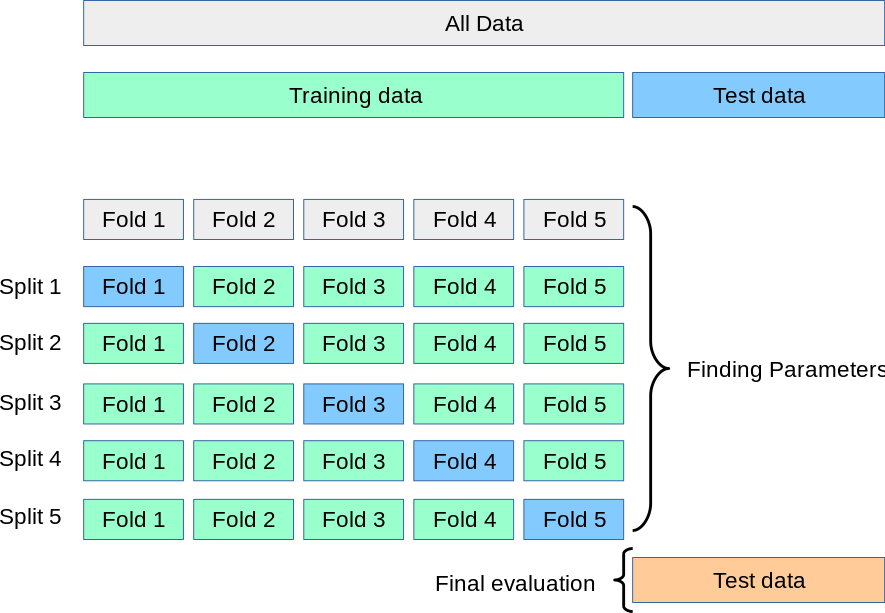

[source image](https://scikit-learn.org/stable/_images/grid_search_cross_validation.png)

Benchmarking models using cross-validation involves splitting the data into several parts, training the model on most of the parts, and testing it on the remaining part. This process is repeated multiple times, each time with a different part used for testing. The performance scores from all the tests are then averaged to give a more reliable estimate of how well the model will perform on unseen data. This method ensures the model's performance is not dependent on any particular train-test split and provides a more accurate measure of its ability to generalize.

In [30]:
# features_selected, list_features

In [31]:
# define the fold for cross validation
kfold_cv = KFold(n_splits = 5, shuffle=True, random_state = RANDOM_STATE)

def get_model_size(model):
    """Return the size of the model in bytes."""
    return sys.getsizeof(pickle.dumps(model))

# selected features based on the RFECV before
features_selected = [
    'EmploymentStatus_Unemployed', 'Monthly Premium Auto',
    'Number of Policies', 'Education', 'Marital Status_Single',
    'Marital Status_Married', 'Total Claim Amount', 'Income',
    'EmploymentStatus_Medical Leave', 'EmploymentStatus_Employed',
    'Vehicle Class_Two-Door Car'
]

# full features after transformer preprocess
list_features = [
    'Vehicle Class_Luxury Car', 'Vehicle Class_Luxury SUV', 'Vehicle Class_SUV',
    'Vehicle Class_Sports Car', 'Vehicle Class_Two-Door Car', 'EmploymentStatus_Employed',
    'EmploymentStatus_Medical Leave', 'EmploymentStatus_Retired', 'EmploymentStatus_Unemployed',
    'Marital Status_Married', 'Marital Status_Single', 'Education', 'Coverage',
    'Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income'
]

# drop for multicollinearity
dropped_cols = [
    'EmploymentStatus_Retired', 'EmploymentStatus_Medical Leave',
    'EmploymentStatus_Unemployed','Vehicle Class_Luxury Car',
    'Marital Status_Single']

# define an evaluation metric - TRAIN, VAL Data
adjusted_r2_cross_mean, mape_cross_mean = [], []
adjusted_r2_cross_std, mape_cross_std = [], []
adjusted_r2_cross_all, mape_cross_all = [], []
fit_cross_time, test_score_time = [], []
cross_val_time = []
model_train_name = []

# looping for performance
for name, model in all_models.items():
    if name in linear_models.keys():
        transformer_choosen = transformer
    else:
        transformer_choosen = transformer_tree

    pipeline_model = Pipeline(steps=[
            ('transformer', transformer_choosen),
            # ('selector', ColumnSelector(columns = features_selected)),
            ('regressor', model)
        ])

    # pipeline_model.named_steps['selector'].set_feature_names(list_features)
    # pipeline_model = set_feature_names_in_selector(pipeline_model, X_train)
    
    start_time_cross = time.time()
    # find the best model - train cross val
    model_cv = cross_validate(
        pipeline_model,
        X_train,
        # transform_X_train_df.drop(columns=dropped_cols),
        y_train,
        cv = kfold_cv,
        # scoring = 'r2',
        scoring = {
            'adjusted_r2': adjusted_r2,
            # 'mean_absolute_percentage_error': make_scorer(mean_absolute_percentage_error, greater_is_better=False),
            'mean_absolute_percentage_error': 'neg_mean_absolute_percentage_error'
        },
        error_score = 'raise'
    )
    end_time_cross = time.time()
    execution_time_cross = end_time_cross - start_time_cross

    adjusted_r2_cross_mean.append(model_cv['test_adjusted_r2'].mean())
    adjusted_r2_cross_std.append(model_cv['test_adjusted_r2'].std())
    # metrics_cross_all.append(model_cv.round(4))

    mape_cross_mean.append(model_cv['test_mean_absolute_percentage_error'].mean())
    mape_cross_std.append(model_cv['test_mean_absolute_percentage_error'].std())


    fit_cross_time.append(model_cv['fit_time'])
    test_score_time.append(model_cv['score_time'])
    cross_val_time.append(execution_time_cross)
    # model_train_name.append(pipeline_model[1].__class__.__name__)
    model_train_name.append(name)
    # model_train_name.append(model.__class__.__name__)

# On Test Data (Score)
# evaluation
adjusted_r2_test_score_list, mape_test_score_list = [], []
model_test_name = []
model_test_size = []
predict_time = []

# On Test Data (Score)
for name, model in all_models.items():
    if name in linear_models.keys():
        transformer_choosen = transformer
    else:
        transformer_choosen = transformer_tree

    pipeline_model = Pipeline(steps=[
            ('transformer', transformer_choosen),
            # ('selector', ColumnSelector(columns = features_selected)),
            ('regressor', model)
        ])

    # pipeline_model.named_steps['selector'].set_feature_names(list_features)
    # pipeline_model = set_feature_names_in_selector(pipeline_model, X_train)
    
    # pipeline_model = model
    start_time_test = time.time()
    # fitting
    pipeline_model.fit(X_train, y_train)
    # pipeline_model.fit(train_smote_res.drop(columns='Customer Lifetime Value'), train_smote_res['Customer Lifetime Value'])
    # model.fit(transform_X_train_df.drop(columns=dropped_cols), y_train)

    # Measure the model size
    model_size = get_model_size(pipeline_model)
    model_test_size.append(model_size)

    # model predict
    y_pred_test = pipeline_model.predict(X_test)
    # y_pred_test = pipeline_model.predict(transform_X_test_df)
    # y_pred_test = model.predict(transform_X_test_df.drop(columns=dropped_cols))

    end_time_test = time.time()
    execution_time_test = end_time_test - start_time_test

    # evaluate
    adjusted_r2_test_score = adjusted_r2_score(y_test, y_pred_test, X_test)
    adjusted_r2_test_score_list.append(adjusted_r2_test_score)

    mape_test_score = mean_absolute_percentage_error(y_test, y_pred_test)
    mape_test_score_list.append(mape_test_score)

    predict_time.append(execution_time_test)
    # model_test_name.append(pipeline_model[1].__class__.__name__)
    model_test_name.append(name)
        # model_test_name.append(model.__class__.__name__)

[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 3025, number of used features: 17
[LightGBM] [Info] Start training from score 6622.958973
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 3025, number of used features: 17
[LightGBM] [Info] Start training from score 6633.824860
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6675.410609
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6616.993918
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6612.988872
[LightGBM] [Info] Total Bins 675
[LightGBM] [Info] Number of data points in the train set: 3782

## Benchmark Base Models Performance Comparison

In [32]:
# show the output
r2_val_rounded = np.array([round(i * 100, 2) for i in adjusted_r2_cross_mean])
r2_test_rounded = np.array([round(i * 100, 2) for i in adjusted_r2_test_score_list])
mape_val_rounded = np.array([round(abs(i) * 100, 2) for i in mape_cross_mean])
mape_test_rounded = np.array([round(i * 100, 2) for i in mape_test_score_list])
fit_time_total = np.array([np.sum(i) for i in fit_cross_time])
test_score_time_total = np.array([np.sum(i) for i in test_score_time])

# save the evaluation result as dataframe
eval_results = pd.DataFrame({
    'Model Name': model_train_name,
    'Adjusted R2 Validation Mean (%)': r2_val_rounded,
    'Adjusted R2 Test Score (%)': r2_test_rounded,
    'Adjusted R2 Difference': r2_test_rounded - r2_val_rounded,
    'MAPE Validation Mean (%)': mape_val_rounded,
    'MAPE Test Score (%)': mape_test_rounded,
    'MAPE Difference': -(mape_test_rounded - mape_val_rounded),
    # 'std': adjusted_r2_cross_std,
    # 'all RMSE value': metrics_cross_all,
    # 'Model Test': model_test_name,
    # 'Computation Time (second)': cross_val_time,
    'Computation Time (second)': fit_time_total + test_score_time_total + np.array(predict_time),
    'Model Size (MB)': [round(i/1_000_000, 4) for i in model_test_size]
})

eval_results = eval_results.sort_values(by=['Adjusted R2 Test Score (%)', 'Adjusted R2 Difference'], ascending = [False, True], key=abs, ignore_index=True)
eval_results.index = np.array([str(i+1) + '} ' for i in eval_results.index]) + eval_results['Model Name']
eval_results.iloc[:, 1:]

,Adjusted R2 Validation Mean (%),Adjusted R2 Test Score (%),Adjusted R2 Difference,MAPE Validation Mean (%),MAPE Test Score (%),MAPE Difference,Computation Time (second),Model Size (MB)
Model Name,,,,,,,,
1} Light Gradient-Boosting Machine Regression,83.24,86.08,2.84,7.52,6.92,0.60,1.955131,0.2850
2} Xtreme Gradient Boosting Regression,81.25,85.93,4.68,10.53,9.09,1.44,1.673633,0.4240
3} Gradient Boosting Regression,82.48,85.89,3.41,5.58,5.40,0.18,6.295730,0.1445
4} Random Forest Regression,82.85,85.33,2.48,6.59,6.25,0.34,132.961399,33.3226
5} Decision Tree Regression,67.99,71.73,3.74,8.28,7.43,0.85,3.069043,0.5430
6} Lasso Regression,22.43,28.37,5.94,42.99,41.21,1.78,0.390006,0.0047
7} Ridge Regression,22.40,28.36,5.96,42.98,41.22,1.76,0.315004,0.0047
8} Linear Regression,22.38,28.36,5.98,42.98,41.23,1.75,0.532515,0.0048
9} TheilSen Regression,21.91,27.97,6.06,40.39,38.92,1.47,16.072675,0.0047


## Insights on Evaluation

Based on the results, the top two models to passthorugh in to the Hyperparameter Tuning Process:
* Light Gradient-Boosting Machine Regression (LGBM) -> The one with the best metrics result (R2 & MAPE).
* Xtreme Gradient Boosting Regressor (XGBoost) -> The one with the best performance from some past historical repetition after tuning.
* Gradient-Boosting Regression -> The one with the most stable between validation & test result (The least value of Difference "0.18" {on MAPE} and "3.41" {on R2}).

## Tuning Three Best Models

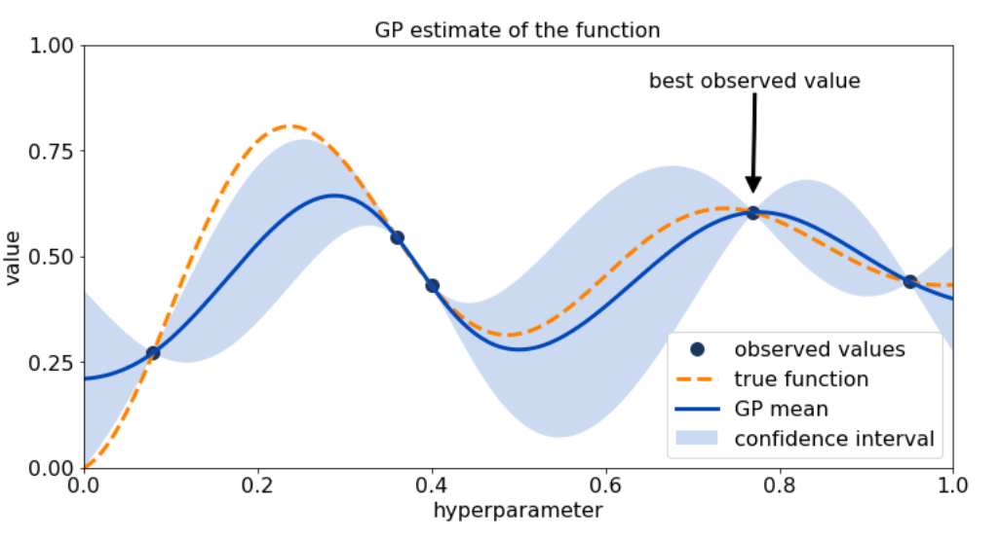

[source image](https://th.bing.com/th/id/OIP.QoU2laIM47XkHrX-H5PUFwAAAA?rs=1&pid=ImgDetMain)

Bayesian Optimization is a method for tuning hyperparameters that builds a model to predict the performance of different hyperparameter settings. It starts by testing a few random settings, then uses these results to build a model that estimates performance and uncertainty for other settings. Based on this model, it chooses the next hyperparameters to test, balancing exploration of new settings and refinement of the best ones found so far. This process continues iteratively, leading to more efficient and effective hyperparameter tuning compared to random or grid search.

### Gradient Boosting

In [129]:
# Define the parameter grid for RandomizedSearchCV
param_spaces_gb = {
    'gboost_regressor__n_estimators': np.arange(100, 701, 50),  # Number of trees
    'gboost_regressor__learning_rate': list(np.arange(1, 100)/100),   # Number of features to consider at every split
    'gboost_regressor__max_depth': np.arange(1, 111, 10).tolist(),  # Maximum depth of the tree
    'gboost_regressor__subsample': list(np.arange(2, 10)/10),   # Minimum number of samples required to split a node
    'gboost_regressor__gamma': np.arange(1, 21),    # Minimum number of samples required at each leaf node
    'gboost_regressor__colsample_bytree': list(np.arange(1, 10)/10),
    'gboost_regressor__reg_alpha': list(np.logspace(-3, 1, 10))                 # Whether bootstrap samples are used when building trees
}

param_spaces_gb = {
    'gboost_regressor__n_estimators': Integer(50, 500),
    'gboost_regressor__max_depth': Integer(3, 10),
    'gboost_regressor__learning_rate': Real(0.01, 0.3, 'log-uniform'),
    'gboost_regressor__subsample': Real(0.6, 1.0),
    'gboost_regressor__min_samples_split': Integer(2, 20),
    'gboost_regressor__min_samples_leaf': Integer(1, 20),
    'gboost_regressor__loss' : ['absolute_error', 'huber', 'squared_error', 'quantile']
}

kfold_cv = KFold(n_splits = 5, shuffle = True, random_state = RANDOM_STATE)

pipe_gb = Pipeline(steps=[
        ('transformer', transformer_tree),
        ('gboost_regressor', GradientBoostingRegressor(random_state = RANDOM_STATE))
    ])

# Initialize RandomizedSearchCV with the parameter grid
random_search_gb = RandomizedSearchCV(
    estimator = pipe_gb,
    param_distributions = param_spaces_gb,
    n_iter = 25,
    scoring = adjusted_r2,
    cv = kfold_cv,
    random_state = RANDOM_STATE
)

# Initialize BayesSearchCV
bayes_search_gb = BayesSearchCV(
    estimator = pipe_gb,
    search_spaces = param_spaces_gb,
    n_iter = 25,
    scoring = adjusted_r2,
    cv = kfold_cv,
    random_state = RANDOM_STATE
)

# Fit RandomizedSearchCV to the training data
bayes_search_gb.fit(X_train, y_train)

BayesSearchCV(cv=KFold(n_splits=5, random_state=233, shuffle=True),
              estimator=Pipeline(steps=[('transformer',
                                         ColumnTransformer(transformers=[('nominal_preprocess',
                                                                          Pipeline(steps=[('imputer_mode',
                                                                                           SimpleImputer(add_indicator=True,
                                                                                                         strategy='most_frequent')),
                                                                                          ('onehot_encoding',
                                                                                           OneHotEncoder(drop='first',
                                                                                                         dtype=<class 'int'>))]),
                                                                          ['Vehicle '
                                                                           'Class',
                                                                           'Employment...
                             'gboost_regressor__min_samples_leaf': Integer(low=1, high=20, prior='uniform', transform='normalize'),
                             'gboost_regressor__min_samples_split': Integer(low=2, high=20, prior='uniform', transform='normalize'),
                             'gboost_regressor__n_estimators': Integer(low=50, high=500, prior='uniform', transform='normalize'),
                             'gboost_regressor__subsample': Real(low=0.6, high=1.0, prior='uniform', transform='normalize')})

In [130]:
# best score
print(f'Best Adjusted R2 Score in Train-Val : {bayes_search_gb.best_score_ * 100:.3f}')
# best n_neighbors
print(f'BEST Params in Train-Val : {bayes_search_gb.best_params_}')

Best Adjusted R2 Score in Train-Val : 85.596
BEST Params in Train-Val : OrderedDict({'gboost_regressor__learning_rate': 0.01980911535112077, 'gboost_regressor__loss': 'squared_error', 'gboost_regressor__max_depth': 4, 'gboost_regressor__min_samples_leaf': 17, 'gboost_regressor__min_samples_split': 2, 'gboost_regressor__n_estimators': 277, 'gboost_regressor__subsample': 0.9778775454837912})


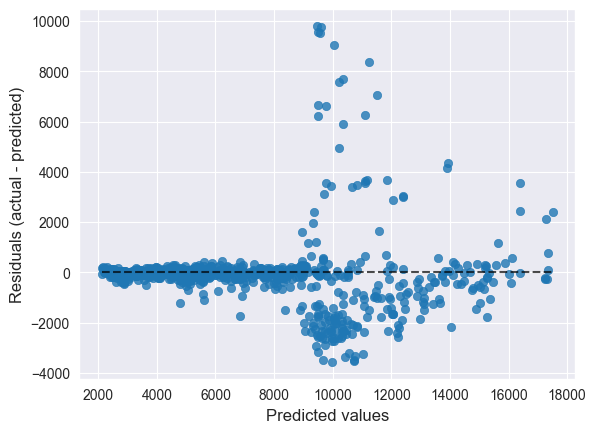

In [131]:
y_pred_gb_tuned = bayes_search_gb.predict(X_test)
PredictionErrorDisplay(y_true=y_test, y_pred=y_pred_gb_tuned).plot();

> There might be quite problem for the model to predict CLV around 9,000 to 14,000 as shown from the graph above, they tend to move away from the zero line of error. The most error itself centered around CLV 10,000 to 11,000.

### LGBM

In [36]:
# Define the parameter grid for RandomizedSearchCV
param_spaces_lgbm = {
    'lightgbm_regressor__num_leaves': Integer(20, 50),
    'lightgbm_regressor__max_depth': Integer(5, 15),
    'lightgbm_regressor__learning_rate': Real(0.01, 0.3, 'log-uniform'),
    'lightgbm_regressor__n_estimators': Integer(50, 500),
    'lightgbm_regressor__min_child_samples': Integer(10, 50),
    'lightgbm_regressor__subsample': Real(0.6, 1.0),
    'lightgbm_regressor__colsample_bytree': Real(0.6, 1.0),
    'lightgbm_regressor__reg_alpha': Real(0, 10),
    'lightgbm_regressor__reg_lambda': Real(0, 10),
    # 'lightgbm_regressor__boosting_type': ['gbdt', 'rf', 'dart']
}

kfold_cv = KFold(n_splits = 5, shuffle = True, random_state = RANDOM_STATE)

pipe_lgbm = Pipeline(steps=[
        ('transformer', transformer_tree),
        # ('selector', ColumnSelector(columns = features_selected)),
        ('lightgbm_regressor', LGBMRegressor(random_state = RANDOM_STATE, n_jobs = -1, force_col_wise = True, verbose = 0))
    ])

# Initialize BayesSearchCV
bayes_search_lgbm = BayesSearchCV(
    estimator = pipe_lgbm,
    search_spaces = param_spaces_lgbm,
    n_iter = 50,
    scoring = adjusted_r2,
    cv = kfold_cv,
    random_state = RANDOM_STATE
)

# Fit RandomizedSearchCV to the training data
bayes_search_lgbm.fit(X_train, y_train)

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

BayesSearchCV(cv=KFold(n_splits=5, random_state=233, shuffle=True),
              estimator=Pipeline(steps=[('transformer',
                                         ColumnTransformer(transformers=[('nominal_preprocess',
                                                                          Pipeline(steps=[('imputer_mode',
                                                                                           SimpleImputer(add_indicator=True,
                                                                                                         strategy='most_frequent')),
                                                                                          ('onehot_encoding',
                                                                                           OneHotEncoder(drop='first',
                                                                                                         dtype=<class 'int'>))]),
                                                                          ['Vehicle '
                                                                           'Class',
                                                                           'Employment...
                             'lightgbm_regressor__num_leaves': Integer(low=20, high=50, prior='uniform', transform='normalize'),
                             'lightgbm_regressor__reg_alpha': Real(low=0, high=10, prior='uniform', transform='normalize'),
                             'lightgbm_regressor__reg_lambda': Real(low=0, high=10, prior='uniform', transform='normalize'),
                             'lightgbm_regressor__subsample': Real(low=0.6, high=1.0, prior='uniform', transform='normalize')})

In [37]:
# best score
print(f'Best Adjusted R2 Score in Train-Val : {bayes_search_lgbm.best_score_ * 100:.3f}')
# best Parameters
print(f'BEST Params in Train-Val : {bayes_search_lgbm.best_params_}')

Best Adjusted R2 Score in Train-Val : 85.404
BEST Params in Train-Val : OrderedDict({'lightgbm_regressor__colsample_bytree': 1.0, 'lightgbm_regressor__learning_rate': 0.01, 'lightgbm_regressor__max_depth': 5, 'lightgbm_regressor__min_child_samples': 10, 'lightgbm_regressor__n_estimators': 500, 'lightgbm_regressor__num_leaves': 20, 'lightgbm_regressor__reg_alpha': 10.0, 'lightgbm_regressor__reg_lambda': 10.0, 'lightgbm_regressor__subsample': 0.6})


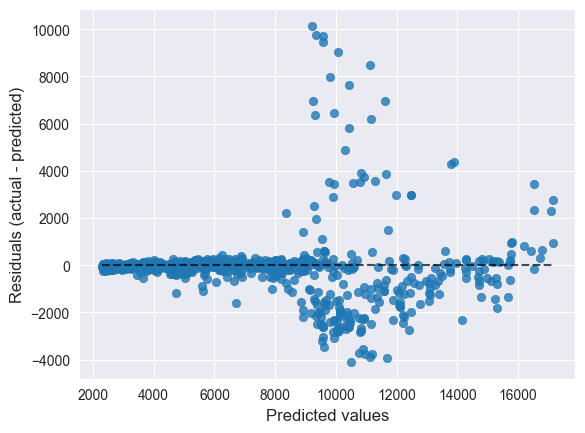

In [38]:
y_pred_lgbm_tuned = bayes_search_lgbm.predict(X_test)
PredictionErrorDisplay(y_true=y_test, y_pred=y_pred_lgbm_tuned).plot();

> There might be quite problem for the model to predict CLV around 8,000 to 14,000 as shown from the graph above, they tend to move away from the zero line of error. The most error itself centered around CLV 10,000.

### XGBoost

In [109]:
# Define the parameter grid for RandomizedSearchCV
param_spaces_xgb = {
    'xgboost_regressor__n_estimators': np.arange(100, 701, 50),  # Number of trees
    'xgboost_regressor__learning_rate': list(np.arange(1, 100)/100),   # Number of features to consider at every split
    'xgboost_regressor__max_depth': np.arange(1, 111, 10).tolist(),  # Maximum depth of the tree
    'xgboost_regressor__subsample': list(np.arange(2, 10)/10),   # Minimum number of samples required to split a node
    'xgboost_regressor__gamma': np.arange(1, 21),    # Minimum number of samples required at each leaf node
    'xgboost_regressor__colsample_bytree': list(np.arange(1, 10)/10),
    'xgboost_regressor__reg_alpha': list(np.logspace(-3, 1, 10))                 # Whether bootstrap samples are used when building trees
}

param_spaces_xgb = {
    'xgboost_regressor__n_estimators': Integer(50, 500),
    'xgboost_regressor__max_depth': Integer(3, 10),
    'xgboost_regressor__learning_rate': Real(0.01, 0.3, 'log-uniform'),
    'xgboost_regressor__subsample': Real(0.6, 1.0),
    'xgboost_regressor__colsample_bytree': Real(0.6, 1.0),
    'xgboost_regressor__gamma': Real(0, 10),
    'xgboost_regressor__reg_alpha': Real(0, 10),
    'xgboost_regressor__reg_lambda': Real(0, 10)
}

kfold_cv = KFold(n_splits = 5, shuffle = True, random_state = RANDOM_STATE)

pipe_xgb = Pipeline(steps=[
        ('transformer', transformer_tree),
        # ('selector', ColumnSelector(columns = features_selected)),
        ('xgboost_regressor', XGBRegressor(random_state = RANDOM_STATE, n_jobs = -1))
    ])

# Initialize RandomizedSearchCV with the parameter grid
random_search_xgb = RandomizedSearchCV(
    estimator = pipe_xgb,
    param_distributions = param_spaces_xgb,
    n_iter = 25,
    scoring = adjusted_r2,
    cv = kfold_cv,
    random_state = RANDOM_STATE
)

# Initialize BayesSearchCV
bayes_search_xgb = BayesSearchCV(
    estimator = pipe_xgb,
    search_spaces = param_spaces_xgb,
    n_iter = 50,
    scoring = adjusted_r2,
    cv = kfold_cv,
    random_state = RANDOM_STATE
)

# Fit RandomizedSearchCV to the training data
bayes_search_xgb.fit(X_train, y_train)

BayesSearchCV(cv=KFold(n_splits=5, random_state=233, shuffle=True),
              estimator=Pipeline(steps=[('transformer',
                                         ColumnTransformer(transformers=[('nominal_preprocess',
                                                                          Pipeline(steps=[('imputer_mode',
                                                                                           SimpleImputer(add_indicator=True,
                                                                                                         strategy='most_frequent')),
                                                                                          ('onehot_encoding',
                                                                                           OneHotEncoder(drop='first',
                                                                                                         dtype=<class 'int'>))]),
                                                                          ['Vehicle '
                                                                           'Class',
                                                                           'Employment...
                             'xgboost_regressor__n_estimators': Integer(low=50, high=500, prior='uniform', transform='normalize'),
                             'xgboost_regressor__reg_alpha': Real(low=0, high=10, prior='uniform', transform='normalize'),
                             'xgboost_regressor__reg_lambda': Real(low=0, high=10, prior='uniform', transform='normalize'),
                             'xgboost_regressor__subsample': Real(low=0.6, high=1.0, prior='uniform', transform='normalize')})

In [160]:
# # best score
# print(f'Best Adjusted R2 Score in Train-Val : {random_search_xgb.best_score_ * 100:.3f}')
# # best n_neighbors
# print(f'BEST Params in Train-Val : {random_search_xgb.best_params_}')

In [110]:
# best score
print(f'Best Adjusted R2 Score in Train-Val : {bayes_search_xgb.best_score_ * 100:.3f}')
# best Parameters
print(f'BEST Params in Train-Val : {bayes_search_xgb.best_params_}')

Best Adjusted R2 Score in Train-Val : 85.778
BEST Params in Train-Val : OrderedDict({'xgboost_regressor__colsample_bytree': 1.0, 'xgboost_regressor__gamma': 10.0, 'xgboost_regressor__learning_rate': 0.032421681936869715, 'xgboost_regressor__max_depth': 3, 'xgboost_regressor__n_estimators': 256, 'xgboost_regressor__reg_alpha': 10.0, 'xgboost_regressor__reg_lambda': 10.0, 'xgboost_regressor__subsample': 1.0})


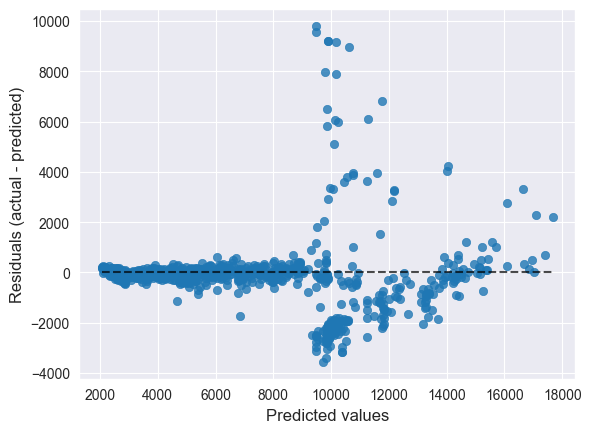

In [111]:
y_pred_xgb_tuned = bayes_search_xgb.predict(X_test)
PredictionErrorDisplay(y_true=y_test, y_pred=y_pred_xgb_tuned).plot();

In [112]:
y_up_9k = y_pred_xgb_tuned[y_pred_xgb_tuned > 9_000]
y_down_13k = y_up_9k[y_up_9k < 13_000]

idx_filtered = [index for index, element in enumerate(y_down_13k)]
display(
    adjusted_r2_score(y_test.reset_index(drop=True).iloc[idx_filtered], y_down_13k,
                      X_test.reset_index(drop=True).iloc[idx_filtered]) * 100,
    mean_absolute_percentage_error(y_test.reset_index(drop=True).iloc[idx_filtered], y_down_13k) * 100
)

-99.85869747169566

118.90421732538911

> There might be quite problem for the model to predict CLV around 9,000 to 15,000 as shown from the graph above, they tend to move away from the zero line of error. The most error itself centered around CLV 10,000. It is proven by the adjusted r2 which got minus result & MAPE around 118%.

In [113]:
bayes_search_xgb.best_estimator_[-1]

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=10.0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.032421681936869715,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=256, n_jobs=-1,
             num_parallel_tree=None, random_state=233, ...)

In [115]:
# model properties

importance_table = pd.DataFrame({
    'imp': bayes_search_xgb.best_estimator_[-1].feature_importances_
}, index = list_features)

importance_table.sort_values(by='imp', ascending=False)

,imp
Number of Policies,0.700458
Monthly Premium Auto,0.231809
Income,0.014926
EmploymentStatus_Employed,0.010357
Marital Status_Single,0.006643
Vehicle Class_Two-Door Car,0.006250
Total Claim Amount,0.005495
Education,0.005438
Marital Status_Married,0.004883
EmploymentStatus_Medical Leave,0.004064


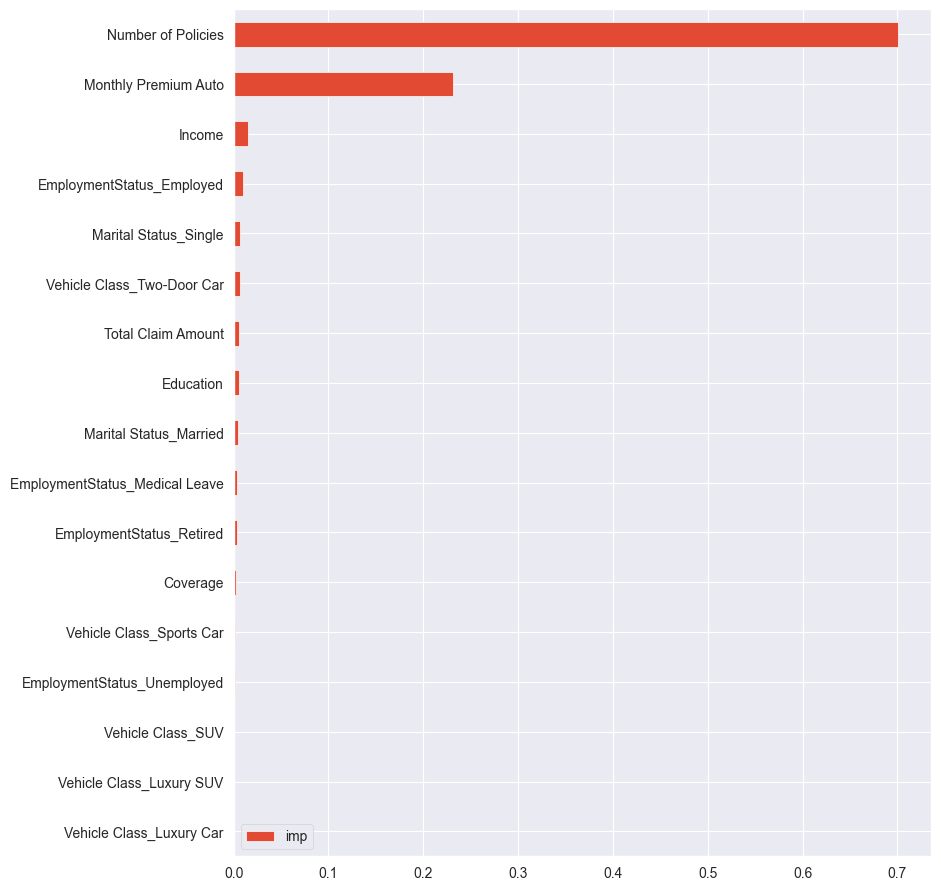

In [116]:
importance_table.sort_values(by='imp').plot(kind='barh', figsize=(9,11));

> We should focusing more on the number of policies & monthly premium auto to catter the needs of luxury type user would return a highest CLV.

## Comparison Tuned vs NOT

In [132]:
# two models to compare before vs after
models_to_compare = {
    # 'XGBoost Default': XGBRegressor(random_state = RANDOM_STATE, n_jobs = -1),
    # 'XGBoost after Tuning': bayes_search_xgb.best_estimator_,
    'LightGBM Default GDBT': LGBMRegressor(random_state = RANDOM_STATE, n_jobs = -1, force_col_wise = True),
    'LightGBM Default Dart': LGBMRegressor(boosting_type = 'dart', random_state = RANDOM_STATE, n_jobs = -1, force_col_wise = True),
    'LightGBM after Tuning': bayes_search_lgbm.best_estimator_,
    'GradientBoosting Default': GradientBoostingRegressor(loss = 'absolute_error', random_state = RANDOM_STATE),
    'GradientBoosting after Tuning': bayes_search_gb.best_estimator_
}

# define the fold for cross validation
kfold_cv = KFold(n_splits = 5, shuffle=True, random_state = RANDOM_STATE)
# skfold = StratifiedKFold(n_splits = 5, random_state = RANDOM_STATE)

def get_model_size(model):
    """Return the size of the model in bytes."""
    return sys.getsizeof(pickle.dumps(model))

# model benchmarking
dropped_cols = [
    'EmploymentStatus_Retired', 'EmploymentStatus_Medical Leave',
    'EmploymentStatus_Unemployed','Vehicle Class_Luxury Car',
    'Marital Status_Single']

# define an evaluation metric - TRAIN, VAL Data
adjusted_r2_cross_mean, mape_cross_mean = [], []
adjusted_r2_cross_std, mape_cross_std = [], []
adjusted_r2_cross_all, mape_cross_all = [], []
fit_cross_time, test_score_time = [], []
cross_val_time = []
model_train_name = []

# looping for performance
for name, model in models_to_compare.items():
    if 'Default' in name:
        pipeline_model = Pipeline(steps=[
            ('transformer', transformer_tree),
            # ('selector', ColumnSelector(columns = features_selected)),
            ('regressor', model)
        ])
    elif 'after' in name:
        pipeline_model = model

    start_time_cross = time.time()
    # find the best model - train cross val
    model_cv = cross_validate(
        pipeline_model,
        X_train,
        # transform_X_train_df.drop(columns=dropped_cols),
        y_train,
        cv = kfold_cv,
        # scoring = 'r2',
        scoring = {
            'adjusted_r2': adjusted_r2,
            # 'mean_absolute_percentage_error': make_scorer(mean_absolute_percentage_error, greater_is_better=False),
            'mean_absolute_percentage_error': 'neg_mean_absolute_percentage_error'
        },
        error_score = 'raise'
    )
    end_time_cross = time.time()
    execution_time_cross = end_time_cross - start_time_cross

    adjusted_r2_cross_mean.append(model_cv['test_adjusted_r2'].mean())
    adjusted_r2_cross_std.append(model_cv['test_adjusted_r2'].std())
    # metrics_cross_all.append(model_cv.round(4))

    mape_cross_mean.append(model_cv['test_mean_absolute_percentage_error'].mean())
    mape_cross_std.append(model_cv['test_mean_absolute_percentage_error'].std())


    fit_cross_time.append(model_cv['fit_time'])
    test_score_time.append(model_cv['score_time'])
    cross_val_time.append(execution_time_cross)
    # model_train_name.append(pipeline_model[1].__class__.__name__)
    model_train_name.append(name)
    # model_train_name.append(model.__class__.__name__)

# On Test Data (Score)
# evaluation
adjusted_r2_test_score_list, mape_test_score_list = [], []
model_test_name = []
model_test_size = []
predict_time = []

# On Test Data (Score)
for name, model in models_to_compare.items():
    if 'Default' in name:
        pipeline_model = Pipeline(steps=[
            ('transformer', transformer_tree),
            # ('selector', ColumnSelector(columns = features_selected)),
            ('regressor', model)
        ])
    elif 'after' in name:
        pipeline_model = model

    start_time_test = time.time()
    # fitting
    pipeline_model.fit(X_train, y_train)
    # model.fit(transform_X_train_df.drop(columns=dropped_cols), y_train)

    # Measure the model size
    model_size = get_model_size(pipeline_model)
    model_test_size.append(model_size)

    # model predict
    y_pred_test = pipeline_model.predict(X_test)
    # y_pred_test = model.predict(transform_X_test_df.drop(columns=dropped_cols))

    end_time_test = time.time()
    execution_time_test = end_time_test - start_time_test

    # evaluate
    adjusted_r2_test_score = adjusted_r2_score(y_test, y_pred_test, X_test)
    adjusted_r2_test_score_list.append(adjusted_r2_test_score)

    mape_test_score = mean_absolute_percentage_error(y_test, y_pred_test)
    mape_test_score_list.append(mape_test_score)

    predict_time.append(execution_time_test)
    # model_test_name.append(pipeline_model[1].__class__.__name__)
    model_test_name.append(name)
        # model_test_name.append(model.__class__.__name__)

[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 3025, number of used features: 17
[LightGBM] [Info] Start training from score 6622.958973
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 3025, number of used features: 17
[LightGBM] [Info] Start training from score 6633.824860
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6675.410609
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6616.993918
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 3026, number of used features: 17
[LightGBM] [Info] Start training from score 6612.988872
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 3025

### The Result Tuned vs NOT

In [133]:
# show the output
r2_val_rounded = np.array([round(i * 100, 2) for i in adjusted_r2_cross_mean])
r2_test_rounded = np.array([round(i * 100, 2) for i in adjusted_r2_test_score_list])
mape_val_rounded = np.array([round(abs(i) * 100, 2) for i in mape_cross_mean])
mape_test_rounded = np.array([round(i * 100, 2) for i in mape_test_score_list])
fit_time_total = np.array([np.sum(i) for i in fit_cross_time])
test_score_time_total = np.array([np.sum(i) for i in test_score_time])

# show the comparison results as dataframe
eval_results = pd.DataFrame({
    'Model Name': model_train_name,
    'Adjusted R2 Validation Mean (%)': r2_val_rounded,
    'Adjusted R2 Test Score (%)': r2_test_rounded,
    'Adjusted R2 Difference': r2_test_rounded - r2_val_rounded,
    'MAPE Validation Mean (%)': mape_val_rounded,
    'MAPE Test Score (%)': mape_test_rounded,
    'MAPE Difference': -(mape_test_rounded - mape_val_rounded),
    # 'std': adjusted_r2_cross_std,
    # 'all RMSE value': metrics_cross_all,
    # 'Model Test': model_test_name,
    # 'Computation Time (second)': cross_val_time,
    'Computation Time (second)': fit_time_total + test_score_time_total + np.array(predict_time),
    'Model Size (MB)': [round(i/1_000_000, 4) for i in model_test_size]
})

eval_results = eval_results.sort_values(by=['Adjusted R2 Test Score (%)', 'Adjusted R2 Difference'], ascending = [False, True], key=abs, ignore_index=True)
eval_results.index = np.array([str(i+1) + '} ' for i in eval_results.index]) + eval_results['Model Name']
eval_results.iloc[:, 1:]

,Adjusted R2 Validation Mean (%),Adjusted R2 Test Score (%),Adjusted R2 Difference,MAPE Validation Mean (%),MAPE Test Score (%),MAPE Difference,Computation Time (second),Model Size (MB)
Model Name,,,,,,,,
1} GradientBoosting after Tuning,85.60,87.15,1.55,6.61,6.48,0.13,14.228995,0.6746
2} LightGBM after Tuning,85.40,86.83,1.43,6.35,6.19,0.16,4.328006,0.9452
3} LightGBM Default GDBT,83.24,86.08,2.84,7.52,6.92,0.60,1.624005,0.2850
4} GradientBoosting Default,82.48,85.89,3.41,5.58,5.40,0.18,6.892007,0.1445
5} LightGBM Default Dart,75.50,79.06,3.56,18.13,17.58,0.55,2.132997,0.2846


> Model XGBoost Regressor Choosen as our best model with its best parameters (after tuning). It does also have lowest computation time (on total) + model size which both quite low if compared to other models.

### Save The Best Model

Interpretation of the XGBoost Regressor Model

- **R² Score Interpretation:**
  - **Validation Set (87.07%):** This high score shows that the model accurately predicts CLV for the validation set, explaining 87.07% of its variance, which suggests the model is well-trained.
  - **Test Set (85.78%):** The model maintains robust performance on unseen data, with 85.78% of the variance in CLV explained, indicating good generalizability.

- **Model Strengths:**
  - **Interpretability:** The decision tree-based nature of XGBoost allows for clear insights into which factors influence CLV, making it easier for stakeholders to understand the model's decisions.
  - **Non-linearity:** XGBoost effectively captures complex relationships in the data, which is crucial given the varied behaviors and characteristics of our luxury vehicle customers.

- **Model Limitations:**
  - **Overfitting Risk:** There is a potential for the model to overfit the training data, which can be mitigated through regular validation and pruning techniques.
  - **Data Sensitivity:** The model's accuracy relies heavily on the quality and consistency of the input data; biased or inconsistent data can reduce prediction accuracy.

In [134]:
bayes_search_gb.best_estimator_

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('nominal_preprocess',
                                                  Pipeline(steps=[('imputer_mode',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='most_frequent')),
                                                                  ('onehot_encoding',
                                                                   OneHotEncoder(drop='first',
                                                                                 dtype=<class 'int'>))]),
                                                  ['Vehicle Class',
                                                   'EmploymentStatus',
                                                   'Marital Status']),
                                                 ('ordinal_preprocess',
                                                  Pipeline(steps=[('imputer_mod...
                                                  ['Education', 'Coverage']),
                                                 ('numerical_preprocess',
                                                  SimpleImputer(add_indicator=True,
                                                                strategy='median'),
                                                  ['Number of Policies',
                                                   'Monthly Premium Auto',
                                                   'Total Claim Amount',
                                                   'Income'])])),
                ('gboost_regressor',
                 GradientBoostingRegressor(learning_rate=0.01980911535112077,
                                           max_depth=4, min_samples_leaf=17,
                                           n_estimators=277, random_state=233,
                                           subsample=0.9778775454837912))])

In [135]:
# the best model is GradientBoosting after tuning
# best_model_regression = bayes_search_gb.best_estimator_.named_steps['xgboost_regressor']
best_model_regression = bayes_search_gb.best_estimator_

model_filepath = 'models'
today_date = time.strftime('%Y%m%d%H%M%S')
model_filename = f'best_model_clv_gb_{today_date}'

# sav format
with open(f'{model_filepath}/{model_filename}.sav', 'wb') as wtm:
    pickle.dump(best_model_regression, wtm)

# pkl format
with open(f'{model_filepath}/{model_filename}.pkl', 'wb') as wtm:
    pickle.dump(best_model_regression, wtm)

In [119]:
# check either the models saved successfully or not!
# !dir models

name_model = 'best_model_clv_xgb_20240718180633.sav'
 
# Check whether the specified
# path exists or not
isExist = os.path.exists(f'models/{name_model}')
print('The model is Sucessfully Saved!' if isExist else 'There is NO Such Model!!!')

The model is Sucessfully Saved!


# 9. Explain of The Best Model on Data Prediction

In [125]:
# the best model for this case
best_model_param = bayes_search_gb.best_estimator_.named_steps['gboost_regressor']
best_model_regression = bayes_search_gb.best_estimator_
best_model_regression

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('nominal_preprocess',
                                                  Pipeline(steps=[('imputer_mode',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='most_frequent')),
                                                                  ('onehot_encoding',
                                                                   OneHotEncoder(drop='first',
                                                                                 dtype=<class 'int'>))]),
                                                  ['Vehicle Class',
                                                   'EmploymentStatus',
                                                   'Marital Status']),
                                                 ('ordinal_preprocess',
                                                  Pipeline(steps=[('imputer_mod...
                                                  Pipeline(steps=[('imputer_median',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('numerical_scaling',
                                                                   RobustScaler())]),
                                                  ['Number of Policies',
                                                   'Monthly Premium Auto',
                                                   'Total Claim Amount',
                                                   'Income'])])),
                ('gboost_regressor',
                 GradientBoostingRegressor(learning_rate=0.022500155668152173,
                                           min_samples_leaf=17,
                                           min_samples_split=4,
                                           n_estimators=320,
                                           random_state=233))])

In [190]:
# num_inverse_X_train_df = transform_X_train_df.copy()
# num_inverse_X_test_df = transform_X_test_df.copy()

# num_inverse_X_train_df[
#     ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income']
#     ] = transformer['numerical_preprocess'].inverse_transform(num_inverse_X_train_df[
#     ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income']
#     ])

# num_inverse_X_test_df[
#     ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income']
#     ] = transformer['numerical_preprocess'].inverse_transform(num_inverse_X_test_df[
#     ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount', 'Income']
#     ])

In [76]:
# # Use SHAP to explain the model predictions (before scaled)
# explainer_ori = shap.TreeExplainer(best_model_regression, num_inverse_X_train_df)
# shap_values_ori = explainer(num_inverse_X_test_df)

# Use SHAP to explain the model predictions (after scaled)
explainer = shap.TreeExplainer(best_model_param, transform_X_train_tree_df)
shap_values = explainer(transform_X_test_tree_df)

# # Use SHAP to explain the model predictions (after scaled)
# explainer = shap.TreeExplainer(best_model_regression, X_train)
# shap_values = explainer(X_test)

## General Shap Meaning

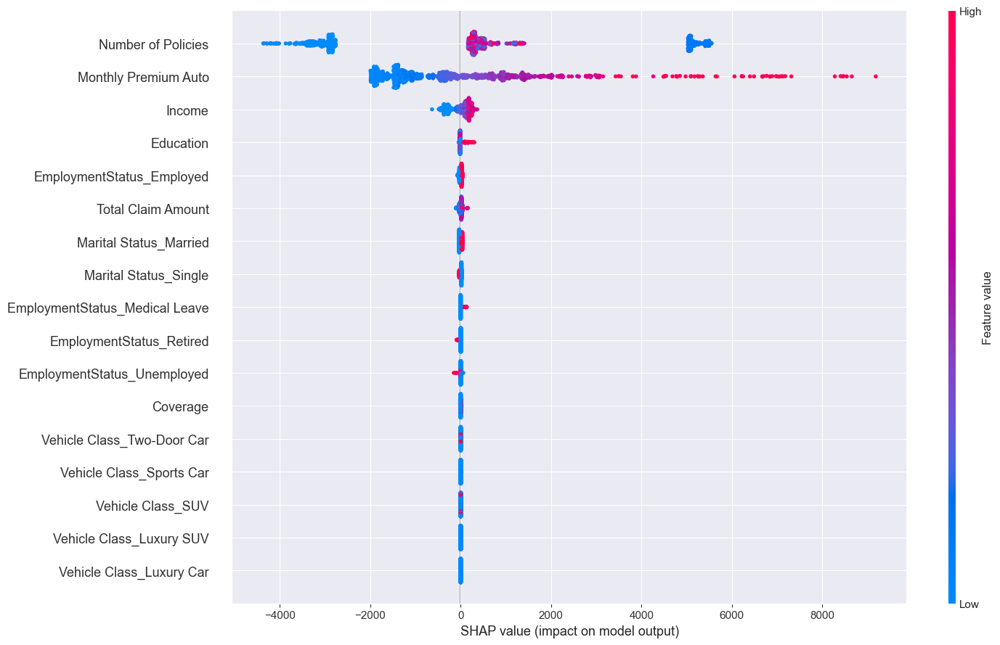

In [77]:
# Plot feature importance
shap.summary_plot(shap_values, transform_X_test_tree_df, plot_size=[15,9])

**Top Features:**

* Number of Policies: This feature shows a wide range of SHAP values, with many blue dots on the left (negative impact) and red dots on the right (positive impact). This suggests that having more policies can both significantly decrease and increase customer lifetime value depending on other factors.

* Monthly Premium Auto: This feature also has a broad range of SHAP values, indicating a significant impact on the model's prediction. Higher values (red) generally increase the prediction, while lower values (blue) tend to decrease it.

* Income: This feature has a mix of positive and negative impacts on the prediction. Higher incomes (red) tend to increase customer lifetime value, while lower incomes (blue) have a negative impact.

In [47]:
shap.force_plot(shap_values, transform_X_test_tree_df)

- The force plot provides a detailed visualization of how the "Number of Policies" feature (and potentially other features if they were labeled) influences the model's predictions across different instances.
- It shows both the positive and negative contributions of the features to the final prediction.
- This plot can help in understanding the variability and the significant impact of key features like "Number of Policies" on the model's predictions, providing insights into the behavior of the model for different instances in the dataset.

In [106]:
transform_X_test_tree_df[transform_X_test_tree_df['Number of Policies'] == 2]

,EmploymentStatus_Unemployed,Monthly Premium Auto,Number of Policies,Education,Marital Status_Single,Marital Status_Married,Total Claim Amount,Income,EmploymentStatus_Medical Leave,EmploymentStatus_Employed,Vehicle Class_Two-Door Car
0,1.0,68.0,2.0,2.0,1.0,0.0,489.600000,0.0,0.0,0.0,1.0
17,0.0,72.0,2.0,2.0,0.0,1.0,68.179721,63110.0,0.0,1.0,0.0
25,1.0,66.0,2.0,1.0,1.0,0.0,316.800000,0.0,0.0,0.0,0.0
26,0.0,63.0,2.0,1.0,0.0,1.0,205.957043,93004.0,0.0,1.0,0.0
32,0.0,69.0,2.0,0.0,0.0,0.0,331.200000,23671.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
925,0.0,69.0,2.0,0.0,0.0,1.0,173.956072,36014.0,0.0,1.0,0.0
929,0.0,101.0,2.0,0.0,0.0,0.0,523.815839,20228.0,0.0,0.0,0.0
931,1.0,74.0,2.0,2.0,0.0,1.0,246.489123,0.0,0.0,0.0,0.0
933,1.0,119.0,2.0,1.0,1.0,0.0,856.800000,0.0,0.0,0.0,0.0


In [48]:
row_position = 17

real_test_peek_no_scaled = pd.Series(
    transform_X_test_tree_df.iloc[row_position]
).T

real_test_peek_no_scaled['True CLV Value'] = y_test.iloc[row_position]
real_test_peek_no_scaled.T

Vehicle Class_Luxury Car              0.000000
Vehicle Class_Luxury SUV              0.000000
Vehicle Class_SUV                     0.000000
Vehicle Class_Sports Car              0.000000
Vehicle Class_Two-Door Car            0.000000
EmploymentStatus_Employed             1.000000
EmploymentStatus_Medical Leave        0.000000
EmploymentStatus_Retired              0.000000
EmploymentStatus_Unemployed           0.000000
Marital Status_Married                1.000000
Marital Status_Single                 0.000000
Education                             2.000000
Coverage                              0.000000
Number of Policies                    2.000000
Monthly Premium Auto                 72.000000
Total Claim Amount                   68.179721
Income                            63110.000000
True CLV Value                     8590.334983
Name: 17, dtype: float64

## Specific SHAP Graph

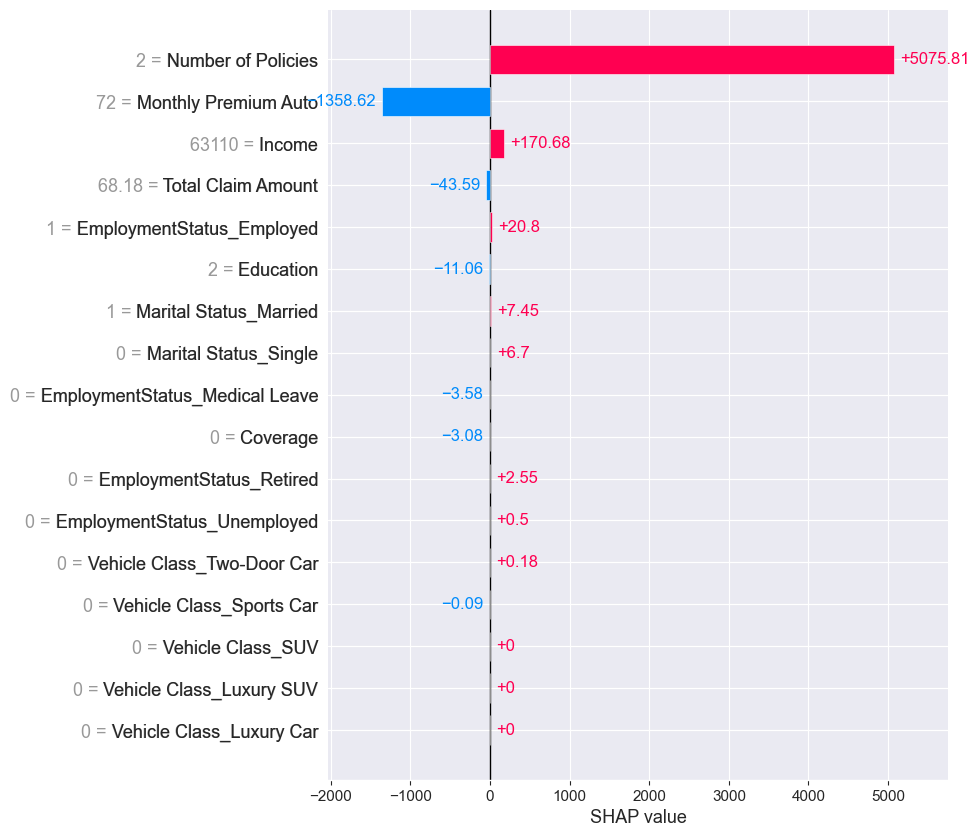

In [107]:
shap.plots.bar(shap_values[17], max_display=19)

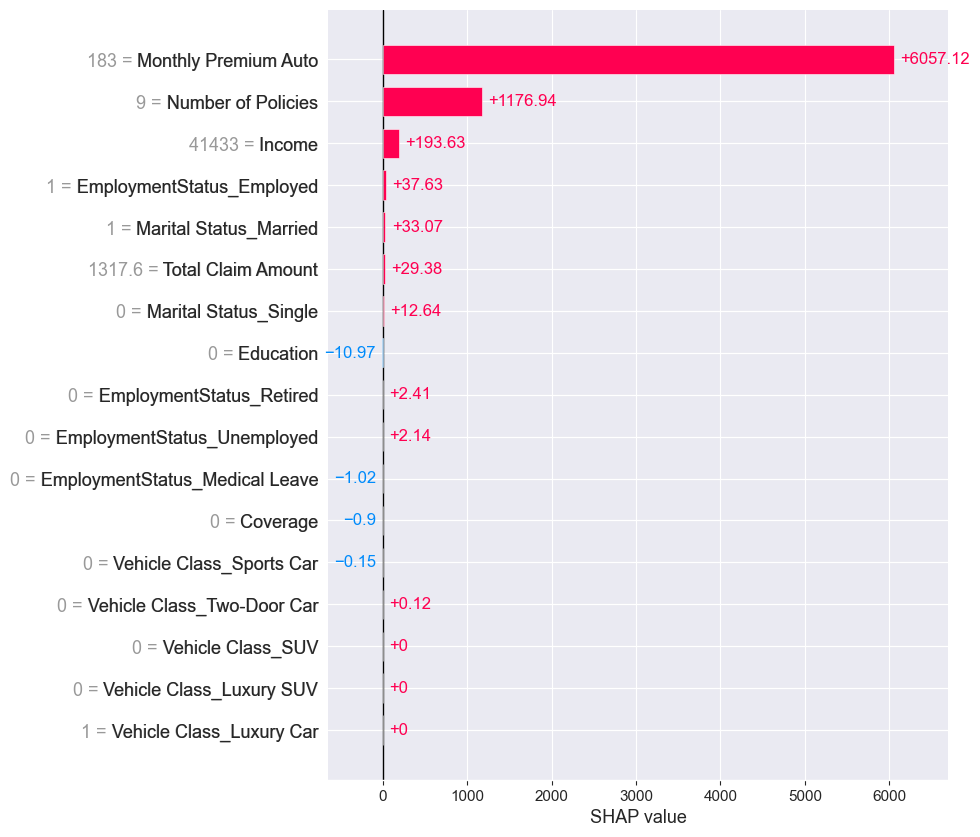

In [82]:
# shap.plots.bar(shap_values_ori[14], max_display=19)
shap.plots.bar(shap_values[99], max_display=19)

Based on these comparison:
* The Number of Policies of 2 is the most impactful feature, significantly increasing the predicted customer lifetime value and not necessarily the highest each customer hold (9) will have the higher impact.
* Monthly Premium Auto has a strong negative impact, reducing the prediction considerably only if it have `Number of Policies` 9, but if it is 2 will have a very different impact.
* Income and EmploymentStatus_Employed contribute positively, while Total Claim Amount and Education have negative effects.
* Features like marital status, employment status, and vehicle class have smaller contributions, with some having no impact at all in this specific case.

## Waterfall Shap Graph

In [74]:
shap.plots.waterfall(shap_values[17], max_display=19)

NameError: name 'shap_values' is not defined

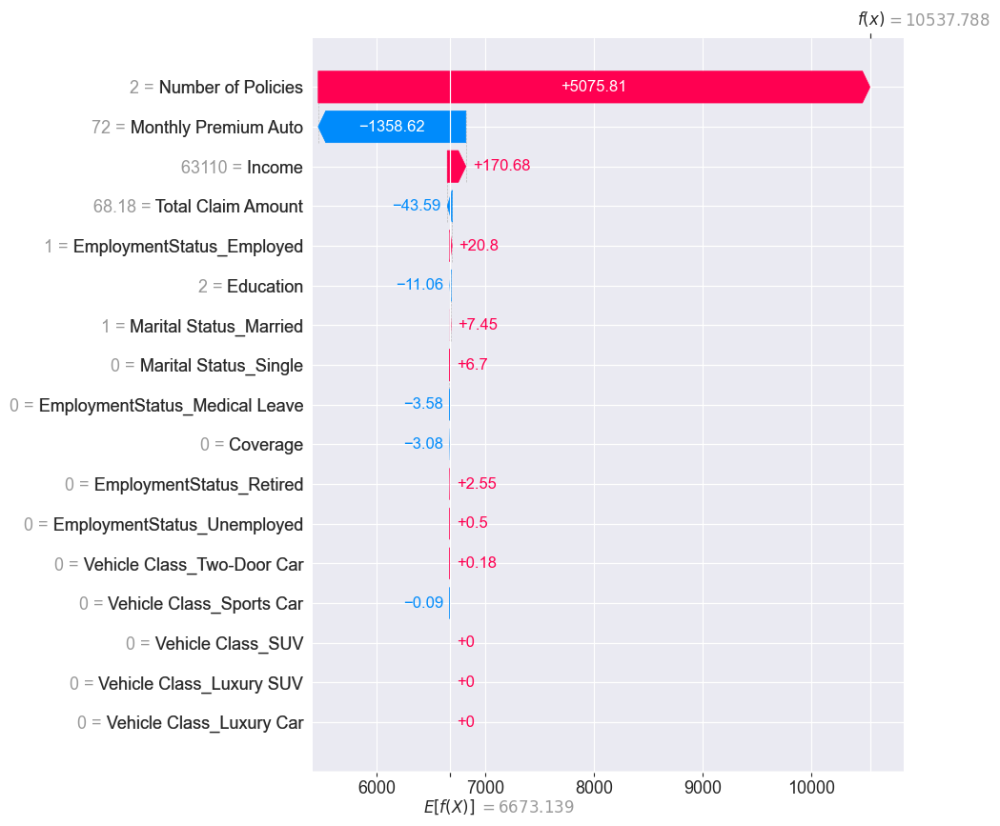

In [54]:
shap.plots.waterfall(shap_values[17], max_display=19)

In [55]:
y_pred_xgb_tuned[17], y_pred_xgb_tuned[99]

(10537.784, 14205.172)

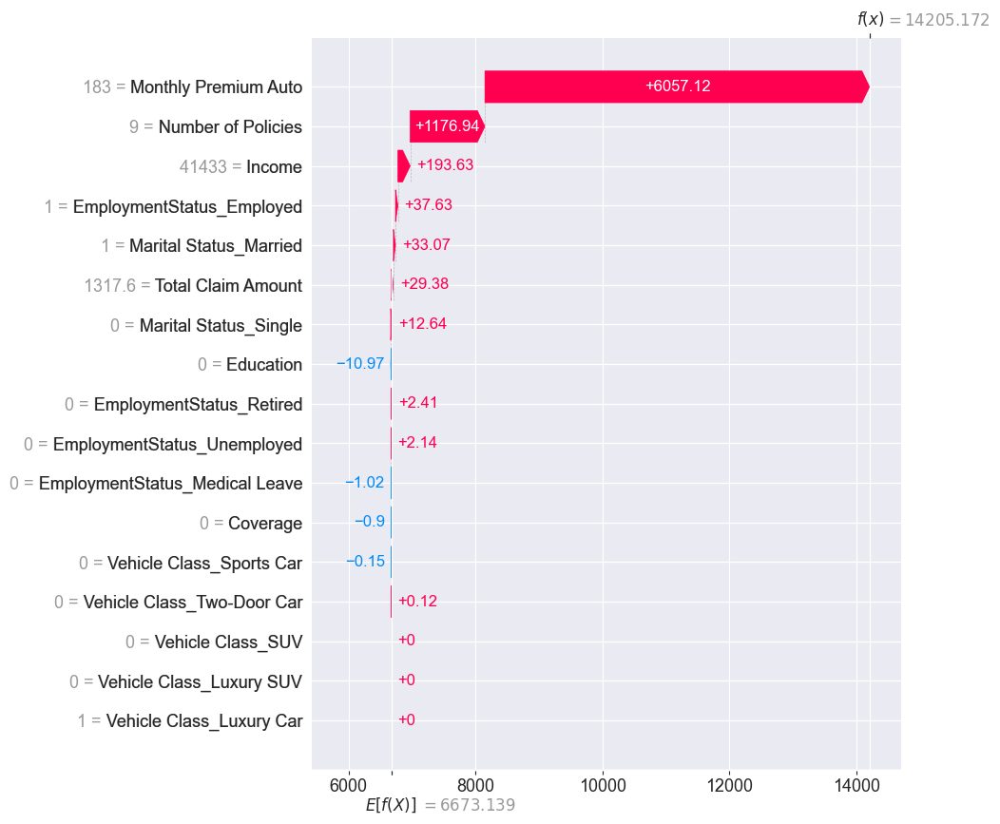

In [56]:
shap.plots.waterfall(shap_values[99], max_display=19)

It shows that for this particular instance, features like Monthly Premium Auto and Number of Policies have significantly increased the prediction when Number of Policies is 9, while features like Education have slightly decreased it. But it does have different effect for Monthly Premium Auto (decrease the prediction) if Number of Policies is 2.

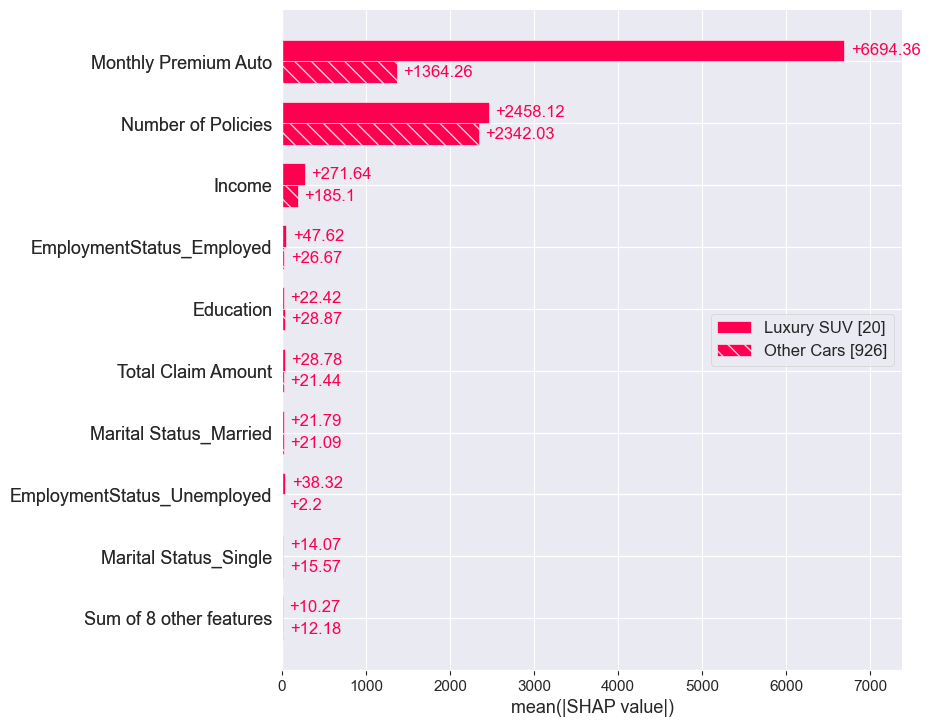

In [57]:
vhc_lux = ["Other Cars" if shap_values[i, "Vehicle Class_Luxury SUV"].data == 0 else "Luxury SUV" for i in range(shap_values.shape[0])]
shap.plots.bar(shap_values.cohorts(vhc_lux).abs.mean(0))

* The Monthly Premium Auto and Number of Policies are the most significant features affecting CLV predictions, with notably higher impacts for luxury SUVs compared to other cars.
* Income and Employment Status - Employed also show substantial contributions, with the impact being relatively higher for luxury SUVs.
* Other features like Education, Total Claim Amount, and Marital Status - Married contribute similarly across both groups.
* Features like Employment Status - Unemployed show a higher impact on luxury SUVs than other cars.
* The Sum of 8 other features collectively has a small but noticeable impact on both groups.

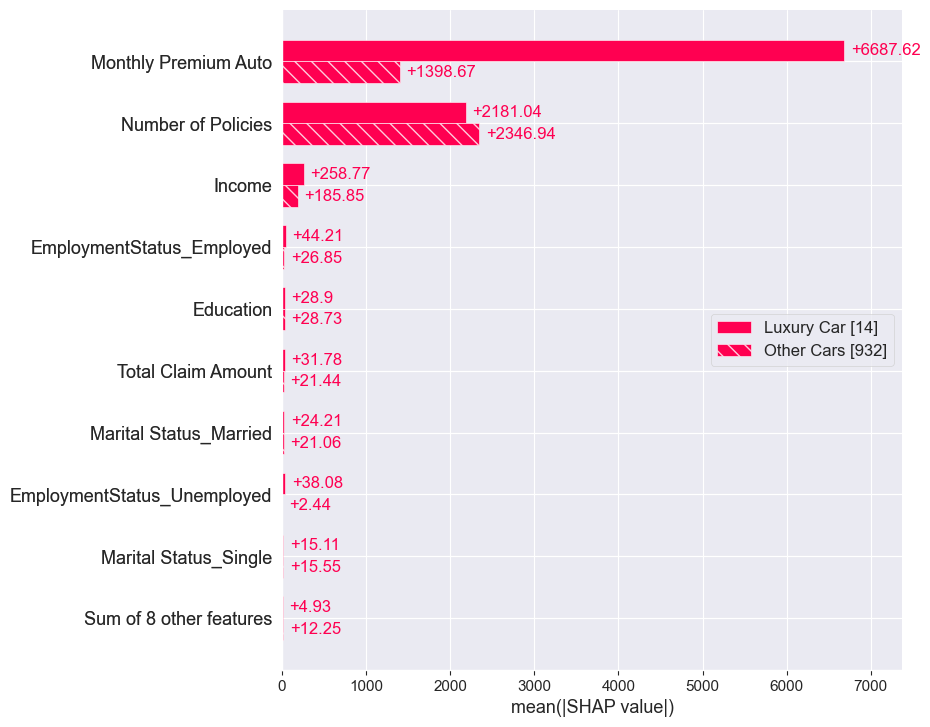

In [58]:
vhc_car = ["Other Cars" if shap_values[i, "Vehicle Class_Luxury Car"].data == 0 else "Luxury Car" for i in range(shap_values.shape[0])]
shap.plots.bar(shap_values.cohorts(vhc_car).abs.mean(0))

* The Monthly Premium Auto and Number of Policies are the most significant features affecting CLV predictions, with notably higher impacts for luxury cars compared to other cars.
* Income and Employment Status - Employed also show substantial contributions, with the impact being relatively higher for luxury cars.
* Other features like Education, Total Claim Amount, and Marital Status - Married contribute similarly across both groups.
* Features like Employment Status - Unemployed show a higher impact on luxury cars than other cars.
* The Sum of 8 other features collectively has a small but noticeable impact on both groups.

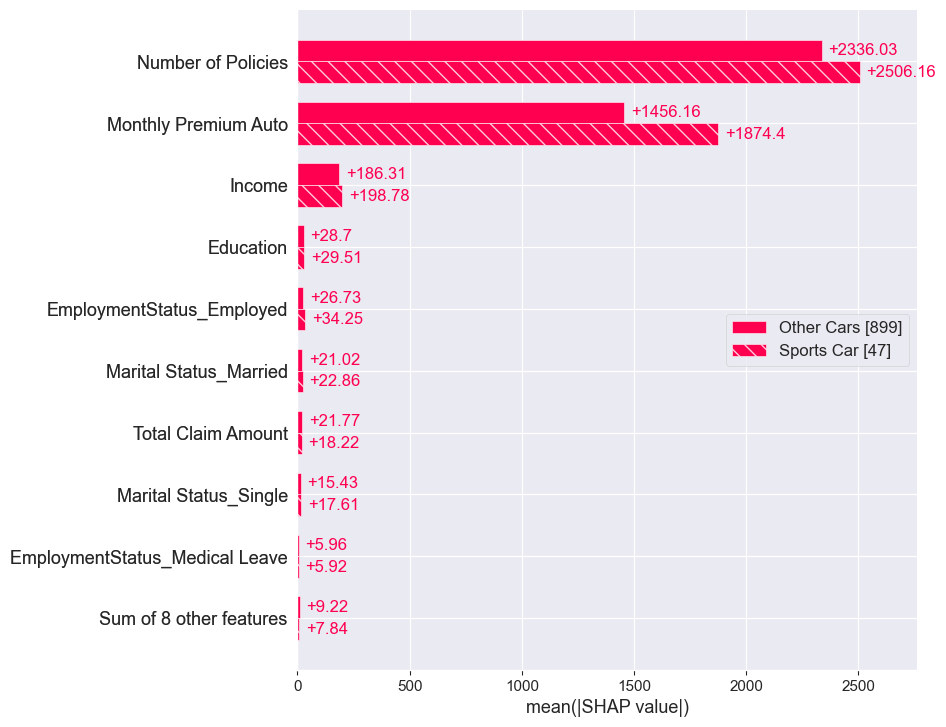

In [60]:
vhc_sport = ["Other Cars" if shap_values[i, "Vehicle Class_Sports Car"].data == 0 else "Sports Car" for i in range(shap_values.shape[0])]
shap.plots.bar(shap_values.cohorts(vhc_sport).abs.mean(0))

* The Number of Policies and Monthly Premium Auto are the most significant features affecting CLV predictions for both sports cars and other cars, with a slightly higher impact for sports cars.
* Income and Employment Status - Employed show substantial contributions, with the impact being relatively higher for sports cars.
* Other features like Education, Total Claim Amount, and Marital Status - Married contribute similarly across both groups.
* Features like Marital Status - Single and Employment Status - Medical Leave show a small but noticeable impact on both groups.
* The Sum of 8 other features collectively has a small impact on both groups.

## Insights on the Relation of Features to the Target

Based on these information, we could say that vehicle type on the luxurious areas are have quite significant impact to the CLV, especially on th `Monthly Premium Auto` and `Number of Policies`. Hence, after we got the prediction for new customers, the direct action would be to change both of these features.

In [424]:
transform_X_test_tree_df.iloc[0]

EmploymentStatus_Unemployed         1.0
Monthly Premium Auto               68.0
Number of Policies                  2.0
Education                           2.0
Marital Status_Single               1.0
Marital Status_Married              0.0
Total Claim Amount                489.6
Income                              0.0
EmploymentStatus_Medical Leave      0.0
EmploymentStatus_Employed           0.0
Vehicle Class_Two-Door Car          1.0
Name: 0, dtype: float64

In [61]:
# import pandas as pd
# import matplotlib.pyplot as plt
# from sklearn.pipeline import make_pipeline
# import lime
# import lime.lime_tabular

# # Assuming `model` is your trained regression model and `X` is your feature matrix
# # Also assuming `X_train` and `y_train` are your training data
# explainer = lime.lime_tabular.LimeTabularExplainer(transform_X_train_tree_df.values, mode='regression')

# # Example features of interest
# features_of_interest = ['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount']

# # Selecting a single instance to explain (adjust as needed)
# instance = transform_X_test_tree_df.iloc[2]

# # Generating explanations for the instance
# explanation = explainer.explain_instance(instance.values, best_model_regression.predict)

# # Extracting feature importance from Lime explanation
# lime_features = explanation.as_list()

# # Creating a DataFrame from Lime features
# lime_df = pd.DataFrame(lime_features, columns=['Feature', 'Importance'])

# # Filtering to include only the features of interest
# lime_df_filtered = lime_df[lime_df['Feature'].isin(features_of_interest)]

# # Plotting the ordered Lime feature importance
# lime_df_filtered.set_index('Feature')['Importance'].sort_values().plot(kind='barh', title='Lime Feature Importance for Selected Features')
# plt.xlabel('Lime Feature Importance')
# plt.ylabel('Feature')
# plt.show()


# Summary 💎

## Model Selection and Performance

The XGBoost Regressor has been selected for predicting Customer Lifetime Value (CLV), achieving strong performance with an R² score of 87.07% on the validation set and 85.78% on the test set. This indicates that the model effectively captures and explains a significant portion of the variance in CLV, demonstrating its accuracy and reliability in predicting future customer value. Although there would be still bad performance around certain CLV range, but most of it could do the job on good term.

The XGBoost Regressor has proven to be a powerful tool for predicting Customer Lifetime Value in LuxeDrive Insurance’s luxury vehicle segments. With high R² scores on both validation and test sets, the model can significantly aid in making informed business decisions to maximize profitability and customer satisfaction. However, we must continually monitor for overfitting and ensure data quality to maintain reliable predictions.

# Recommendation

1. **Enhance Data Collection and Quality**: Implement a comprehensive data collection framework to capture detailed customer demographics, vehicle details, and driving behavior, aiming to increase data completeness and accuracy by 20% within the next 6 months. Utilizing automated validation tools and integrating multiple data sources, such as telematics and customer surveys, will enrich the dataset. Improved data quality will lead to more accurate CLV predictions, enabling better-targeted marketing campaigns and personalized insurance products, ultimately increasing customer retention and profitability.

2. **Implement Targeted Marketing Campaigns**: Develop and launch campaigns for high CLV customers in luxury car, SUV, and sports car segments, targeting a 15% increase in conversion rates over the next 12 months. Use the refined CLV model to identify and segment high-value customers, tailoring marketing messages to their specific needs. These targeted campaigns will enhance customer acquisition and retention, driving higher revenues and market share in the luxury vehicle insurance segment.

3. **Personalize Insurance Products**: Design customized insurance packages for luxury car, SUV, and sports car owners, aiming for a 10% increase in uptake within the next year. Leverage insights from the CLV model to identify key features valued by high CLV customers and incorporate them into new offerings. Personalized products will improve customer satisfaction and loyalty, leading to longer customer lifetimes and increased profitability.

4. **Optimize Pricing Strategies**: Develop dynamic pricing models (especially for the monthly auto) that adjust premiums based on predicted CLV and risk profiles, with a goal to increase overall premium revenue by 8% within 12 months. Utilize machine learning algorithms to analyze customer data and implement real-time pricing adjustments. Optimized pricing will attract and retain high-value customers, enhancing revenue and maintaining a competitive edge in the luxury vehicle insurance market.

5. **Improve Customer Service and Engagement**: Enhance customer service by implementing a dedicated support team for high-value customers and introducing regular engagement initiatives, aiming to increase customer satisfaction scores by 10% and reduce churn rate by 5% over the next year. Provide specialized training for support staff and use customer engagement tools, such as personalized communications and loyalty programs, to strengthen relationships. Superior customer service and engagement will foster stronger customer loyalty, reduce churn, and contribute to a more stable and profitable customer base.

By focusing on these recommendations, LuxeDrive Insurance can significantly enhance its business operations and profitability while providing exceptional value to its high-end clientele.

---

# <center style='background-color:navy'>Thank You</center>